<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Capstone: Shopee Sales Analysis

## Executive Summary
[*Jump to table of contents*](#Table-of-Contents)

In this analysis, we will be using the pycaret library to get the best models to predict sales performance in terms of quantity on Shopee. This project be focused on the Beauty and Personal Care category. This will not only allow us to forecast future sales performances in terms of categories, and will help sellers remain competitive on the platform. This in turn, increases sellers' efficiency on the platform.

We will be scraping data using Selenium from shops mainly on Shopee Mall, as it is an area on Shopee that lists verified sellers - mainly authorised distributors, retailers and flagship stores. These sellers are all regulated and are required to sell authentic products, following the guidelines of the brands they are selling. We will focus mainly on Watsons Official Store as it has a huge variety of 3000 product listings from different brands and categories within the health and beauty category, which provides us with a substantial sample size. 

The provided data dictionary is reflected below, along with an additional column describing the corresponding data type.

**The main metric we will be using to assess the models is RMSE (root mean squared error) as it allows us to accurately assess how a model performs both on train and test data. Although we are optimizing for RMSE, we will also be looking at R2 to compare between models. 

This analysis will benefit retailers in the Health and Beauty industry to make better business decisions and pick more popular products to increase sales. On Shopee, we can see that there is a limit of 3000 product listings, and larger distributors and retailers will have more than 3000 products. Listing products online, apart from their brick and mortar stores requires additional costs (creation of listings, allocating stocks to e-commerce, online stock inventory system etc.). Hence this will help Health and Beauty retailers have a better selection of products from popular categories, meeting the needs of shoppers.

In this analysis, we will be looking to answer the following questions:
* What features are most relevant for sellers to increase sale quantity?
* In what ways do categories or sub categories impact sales quantity?
* What mechanics are ideal for their range of products? 
* What other insights can we get from the analysis? 


## Problem Statement
This project aims to help retailers in the Health and Beauty industry by finding out key features or criterias that affect sale quantity on e-commerce platform. This allows sellers to have better selections of products that better suit the needs of shoppers on Shopee. 

The model can also be used to forecast future sales, and hence allow brands to restock sufficient quantities to meet the volume on the platform. This prevents sellers and brands from missing out on sales.

The model will be trained using products from Watsons' official store on Shopee Mall, using the PyCaret which will determine the suitable models. 

## Table of Contents

* [i. Data Dictionary](#i.-Data-Dictionary)
    * [1. Data Cleaning](#1.-Data-Cleaning)
        * [1.1 Import Libraries](#1.1-Import-Libraries)
        * [1.2 First look at `watsons_test1.csv`](#1.2-First-look-at-watsons_test1.csv)
        * [1.3 Dealing with null values](#1.3-Dealing-with-null-values)
        * [1.4 Data Cleaning](#1.4-Data-Cleaning)
        * [1.5 Feature Engineering](#1.5-Feature-Engineering)
    * [2. Exploratory Data Analysis (EDA)](#2.-Exploratory-Data-Analysis-(EDA))
        * [2.1 Quantity Sold Analysis](#2.1-Quantity-Sold-Analysis)

## 1. Data Cleaning
[*Jump to table of contents*](#Table-of-Contents)
### 1.1 Import Libraries
[*Jump to table of contents*](#Table-of-Contents)

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['font.size'] = 14

sns.set_style(style='white')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
import warnings
warnings.filterwarnings("ignore")

### 1.2 First look at `watsons_test1.csv`
[*Jump to table of contents*](#Table-of-Contents)

In [4]:
# load CSV file as df
df = pd.read_csv('watsons_test1.csv')

In [5]:
df.T

0     \
Unnamed: 0                                                          0   
ProductName         SD BIOSENSOR Standard Q Covid-19 AG Home Test ...   
OriginalPrice                                                     NaN   
SalePrice                                                       $7.30   
Discount                                                      44% OFF   
FreeShpping                                        62 piece available   
Vouchers                                                          NaN   
Ratings                                                           4.9   
NoOfRatings                                                       830   
Star5                                                    5 Star (792)   
Star4                                                     4 Star (28)   
Star3                                                      3 Star (3)   
Star2                                                      2 Star (1)   
Star1                                                      1 Star (6)   
Comments                                          With Comments (424)   
Media                                                With Media (312)   
Brand                                                    SD BIOSENSOR   
QtySold                                                         16.5k   
Stocks                                                             62   
Favourites                                            Favorite (1.7k)   
Shop                                                  watsonsofficial   
TotalRatings                                                    23.1k   
TotalProducts                                                   23.1k   
TotalFollowers                                                  18.7k   
Category            Shopee\nHealth & Wellness\nMedical Supplies\nH...   
ProductDescription  SD BIOSENSOR Standard Q Covid-19 AG Home Test ...   
link                https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...   

                                                                 1     \
Unnamed: 0                                                          1   
ProductName                                    Kodomo Baby Wipes 70'S   
OriginalPrice                                                   $2.00   
SalePrice                                                        None   
Discount                                                         None   
FreeShpping                                        63 piece available   
Vouchers                                                          NaN   
Ratings                                                           5.0   
NoOfRatings                                                       251   
Star5                                                    5 Star (245)   
Star4                                                      4 Star (3)   
Star3                                                      3 Star (1)   
Star2                                                      2 Star (1)   
Star1                                                      1 Star (1)   
Comments                                           With Comments (96)   
Media                                                 With Media (61)   
Brand                                                          KODOMO   
QtySold                                                          4.2k   
Stocks                                                             63   
Favourites                                             Favorite (222)   
Shop                                                  watsonsofficial   
TotalRatings                                                    23.1k   
TotalProducts                                                   23.1k   
TotalFollowers                                                  18.7k   
Category            Shopee\nToys, Kids & Babies\nBath & Baby Care\...   
ProductDescription  Watsons is Singapore's leading beauty and heal...   
link                https://shopee.sg/Kodomo-Baby

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Unnamed: 0          3000 non-null   int64 
 1   ProductName         3000 non-null   object
 2   OriginalPrice       2999 non-null   object
 3   SalePrice           3000 non-null   object
 4   Discount            3000 non-null   object
 5   FreeShpping         2978 non-null   object
 6   Vouchers            2683 non-null   object
 7   Ratings             3000 non-null   object
 8   NoOfRatings         3000 non-null   int64 
 9   Star5               2985 non-null   object
 10  Star4               2985 non-null   object
 11  Star3               2985 non-null   object
 12  Star2               2985 non-null   object
 13  Star1               2985 non-null   object
 14  Comments            2985 non-null   object
 15  Media               2985 non-null   object
 16  Brand               2980

### 1.3 Dealing with null values
[*Jump to table of contents*](#Table-of-Contents)

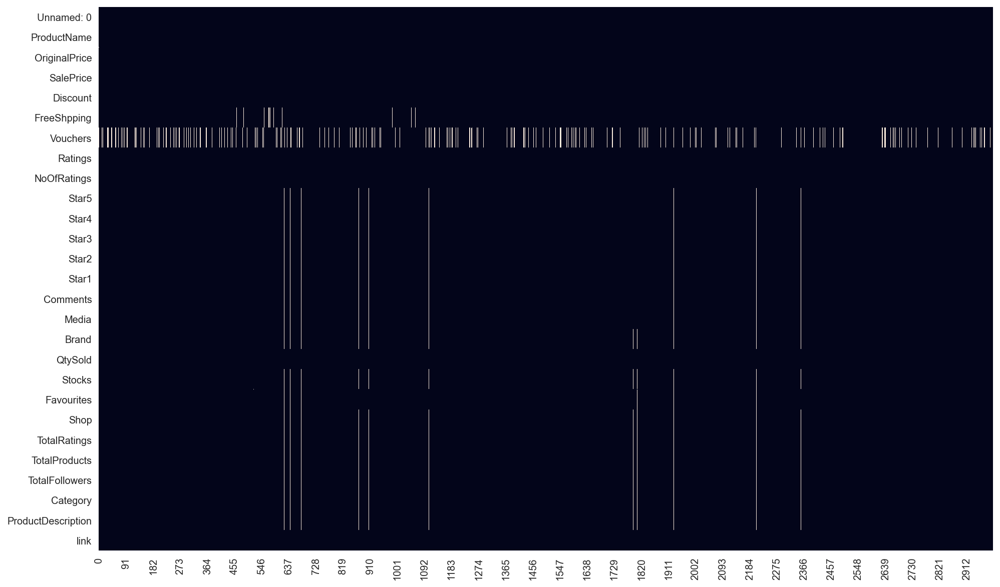

In [7]:
g = sns.heatmap(df.T.isna(), yticklabels=True, cbar=None)
g.figure.set_size_inches(16, 10);

#### 1.3.1 Removing `Unnamed: 0` column

In [8]:
#Remove Unnamed: 0 - it is a index column
df.drop(columns=['Unnamed: 0'], axis=1, inplace=True)
df.shape # Check if the column is dropped

(3000, 26)

#### 1.3.2 Imputing Missing Value for `OriginalPrice`

In [9]:
# As only 1 original price is missing, we will check the link to obtain original price ($13)
df['link'][0]

'https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covid-19-AG-Home-Test-Antigen-Rapid-Self-Test-(ART)-Kit-1s-(Expiry-May-2023)-i.195238920.9681034792?sp_atk=ce252ccf-ade4-411e-bc83-b6baecd6153d'

In [10]:
# Locate index of null value
df[df['OriginalPrice'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShpping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,NaN,$7.30,44% OFF,62 piece available,NaN,4.9,830,5 Star (792),4 Star (28),3 Star (3),2 Star (1),1 Star (6),With Comments (424),With Media (312),SD BIOSENSOR,16.5k,62,Favorite (1.7k),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...


In [11]:
# Impute missing value with $13.00 which is 
df.loc[0, 'OriginalPrice'] = '$13.00'
df.head(1) # Check if missing value is imputed

,ProductName,OriginalPrice,SalePrice,Discount,FreeShpping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,62 piece available,NaN,4.9,830,5 Star (792),4 Star (28),3 Star (3),2 Star (1),1 Star (6),With Comments (424),With Media (312),SD BIOSENSOR,16.5k,62,Favorite (1.7k),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...


#### 1.3.3 Imputing Missing Values for `FreeShipping`

In [12]:
# Checking Freeshipping column
df['FreeShpping'].value_counts()

Free shipping for orders over $40.00    2488
Shipping Fee\nUnsupported Address         80
Shipping Fee\n$0.00 - $4.00               58
2 piece available                         48
1 piece available                         36
3 piece available                         31
5 piece available                         22
6 piece available                         17
4 piece available                         16
7 piece available                         16
Shipping Fee\n$0.00                       13
10 piece available                        12
11 piece available                        10
9 piece available                         10
12 piece available                         9
14 piece available                         9
23 piece available                         8
0 piece available                          7
8 piece available                          7
13 piece available                         7
16 piece available                         5
22 piece available                         5
21 piece a

From the `value_counts()` above we can see that the Xpath that was referred to was some how inconsistent across pages and are indicating the stock available instead of the product's free shipping eligibility. We will hence dive deeper into the data.

In [13]:
# Checking Freeshipping column
df[df['FreeShpping'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShpping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
430,DR BRONNER'S Citrus Castile Liquid Soap - 473ml,$22.90,$21.65,5% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,4.9,8,5 Star (7),4 Star (1),3 Star (0),2 Star (0),1 Star (0),With Comments (6),With Media (3),Dr. Bronner's,37,Liquid,Favorite (4),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nB...,Multiwash benefit for Face and Body. Dr.Bronne...,https://shopee.sg/DR-BRONNER'S-Citrus-Castile-...
460,Caltrate 3 In 1 Triple Action Vitamin D3 + Min...,$56.20,$50.50,10% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,5.0,7,5 Star (7),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (6),With Media (3),CALTRATE,13,45,Favorite (9),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,"""Plus Minerals 100 TabletsDo not exceed the re...",https://shopee.sg/Caltrate-3-In-1-Triple-Actio...
462,Nivea Intensive Moisture Body Milk 400Ml,$9.95,$8.85,11% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,4.8,12,5 Star (11),4 Star (0),3 Star (1),2 Star (0),1 Star (0),With Comments (6),With Media (5),Nivea,40,8,Favorite (7),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nB...,"Enriched with highly concentrated Vitamin E, t...",https://shopee.sg/Nivea-Intensive-Moisture-Bod...
463,EUCERIN UltraWhite Spotless Booster Treatment ...,$94.00,$84.60,10% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,5.0,11,5 Star (11),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (7),With Media (4),Eucerin,23,21,Favorite (16),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nClea...,Product Details\nEucerin UltraWhite Spotless B...,https://shopee.sg/EUCERIN-UltraWhite-Spotless-...
486,COLGATE Plax Mouthwash Active Salt 1L,$10.50,$10.30,2% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,5.0,7,5 Star (7),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (2),With Media (2),Colgate,14,2,Favorite (1),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nMou...,Contains pure sea salt known to inhibit bacter...,https://shopee.sg/COLGATE-Plax-Mouthwash-Activ...
490,Aveeno Dermexa Daily Emollient Cream 200ml,$19.90,$18.70,6% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,5.0,7,5 Star (7),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (4),With Media (3),Aveeno,20,Cream,Favorite (3),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,This breakthrough cream is clinically shown to...,https://shopee.sg/Aveeno-Dermexa-Daily-Emollie...
504,Tampax Pearl Super Plus 18'S,$11.90,$9.40,21% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,5.0,5,5 Star (5),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (2),With Media (2),Tampax,37,34,Favorite (6),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Tampax-Pearl-Super-Plus-18'S...
524,DR. WU Ageversal Advanced Eye Cream 15ml,$89.90,$80.80,10% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,4.8,6,5 Star (5),4 Star (1),3 Star (0),2 Star (0),1 Star (0),With Comments (4),With Media (4),DR.WU,13,4,Favorite (6),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nEye ...,DR WU Ageversal Advanced Eye Cream protects th...,https://shopee.sg/DR.-WU-Ageversal-Advanced-Ey...
555,Hada Labo Hydrating uv perfect gel spf 50+ 80G,$35.90,$32.20,10% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,5.0,6,5 Star (6),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (4),With Media (3),Hada Labo,16,4,Favorite (24),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nSun ...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Hada-Labo-Hydrating-uv-perfe...
559,Silkygirl Cute Nails Polish Remover Extra Stre...,$4.90,$4.30,12% OFF,NaN,$6 OFF\n$12 OFF\n$25 OFF,5.0,5,5 Star (5

In [14]:
# Doing random checks on several Freeshipping Null & odd values links
df['link'][570]

'https://shopee.sg/BLACKMORES-Evening-Primrose-Oil-Fish-Oil-120-Capsules-i.195238920.5587907537?sp_atk=6172faa7-509e-4e72-9550-5e2115599d33'

After checking several links, we can see that there is a **storewide free shipping of min \\$40 spent**. We will hence impute the whole column with "Free shipping for orders over \\$40.00".

In [15]:
# Replace values for entire column
df['FreeShpping'] = "Free shipping for orders over $40.00"
# Check if values are all replaced
df['FreeShpping'].value_counts()

Free shipping for orders over $40.00    3000
Name: FreeShpping, dtype: int64

In [16]:
# Realised that there is a typo in column name, hence change column name
df.rename(columns={'FreeShpping': 'FreeShipping'}, inplace = True)
# Checking Freeshipping column
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,NaN,4.9,830,5 Star (792),4 Star (28),3 Star (3),2 Star (1),1 Star (6),With Comments (424),With Media (312),SD BIOSENSOR,16.5k,62,Favorite (1.7k),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,NaN,5.0,251,5 Star (245),4 Star (3),3 Star (1),2 Star (1),1 Star (1),With Comments (96),With Media (61),KODOMO,4.2k,63,Favorite (222),watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,Free shipping for orders over $40.00,$6 OFF\n$12 OFF\n$25 OFF,5.0,70,5 Star (68),4 Star (2),3 Star (0),2 Star (0),1 Star (0),With Comments (32),With Media (19),Dr.Tung's,648,61,Favorite (68),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,Free shipping for orders over $40.00,$6 OFF\n$12 OFF\n$25 OFF,5.0,154,5 Star (151),4 Star (2),3 Star (1),2 Star (0),1 Star (0),With Comments (59),With Media (53),Watsons,606,Cream,Favorite (76),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,Free shipping for orders over $40.00,$6 OFF\n$12 OFF\n$25 OFF,5.0,143,5 Star (140),4 Star (2),3 Star (0),2 Star (0),1 Star (1),With Comments (51),With Media (44),Watsons,439,40,Favorite (96),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


#### 1.3.4 Imputing Missing Values for `Vouchers` column

In [17]:
# Checking Vouchers column
df['Vouchers'].value_counts()

$6 OFF\n$12 OFF\n$25 OFF    2664
None                          19
Name: Vouchers, dtype: int64

In [18]:
df[df['Vouchers']=="None"].head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
2519,Gillette The Fusion Cooling Formula Gives A Ge...,$19.90,None,None,Free shipping for orders over $40.00,None,None,4,None,None,None,None,None,None,None,Gillette,None,1,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMen's Grooming...,The Fusion Cooling Formula gives a gentle shav...,https://shopee.sg/Gillette-The-Fusion-Cooling-...
2523,EU YAN SANG Quality Bird's Nest with Reduced S...,$47.90,$42.25,12% OFF,Free shipping for orders over $40.00,None,None,5,None,None,None,None,None,None,None,Eu Yan Sang,None,1,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nFood & Beverages\nFood Staples\nCanned...,Eu Yan Sang Quality Bird's Nest with Rock Suga...,https://shopee.sg/EU-YAN-SANG-Quality-Bird's-N...
2526,Sebamed Clear Face Starter Kit 1 Set,$13.15,None,None,Free shipping for orders over $40.00,None,None,6,None,None,None,None,None,None,None,Sebamed,None,Facial Care,Favorite (4),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nGift...,"Cleanse, tone and moisturize with Clear Face S...",https://shopee.sg/Sebamed-Clear-Face-Starter-K...
2538,Senka Perfect Aqua Rich Mask - Extra Moist 1Pc,$2.00,None,None,Free shipping for orders over $40.00,None,None,5,None,None,None,None,None,None,None,senka,None,51,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMask,24HRS LONG-LASTING HYDRATION IN 1 MASK\n\nForm...,https://shopee.sg/Senka-Perfect-Aqua-Rich-Mask...
2564,Suisai Beauty Clear Micro Wash 130g,$27.00,None,None,Free shipping for orders over $40.00,None,None,3,None,None,None,None,None,None,None,suisai,None,5,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nGift Sets,1) Contains two types of clay that are smaller...,https://shopee.sg/Suisai-Beauty-Clear-Micro-Wa...


In [19]:
df[df['Vouchers'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,NaN,4.9,830,5 Star (792),4 Star (28),3 Star (3),2 Star (1),1 Star (6),With Comments (424),With Media (312),SD BIOSENSOR,16.5k,62,Favorite (1.7k),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,NaN,5.0,251,5 Star (245),4 Star (3),3 Star (1),2 Star (1),1 Star (1),With Comments (96),With Media (61),KODOMO,4.2k,63,Favorite (222),watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
5,ORITA Dehumidifier Charcoal 650ml x 48s (Per C...,$88.00,$64.70,26% OFF,Free shipping for orders over $40.00,NaN,5.0,100,5 Star (96),4 Star (4),3 Star (0),2 Star (0),1 Star (0),With Comments (70),With Media (59),ORITA,203,Dehumidifier,Favorite (64),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHome Appliances\nCooling & Heating\nAi...,ORITA Dehumidifier Charcoal 650ml x 48s (Per C...,https://shopee.sg/ORITA-Dehumidifier-Charcoal-...
11,Kinohimotsu Stemcell Drink 50ml x 16s + 6s,$138.90,$69.00,50% OFF,Free shipping for orders over $40.00,NaN,5.0,83,5 Star (81),4 Star (2),3 Star (0),2 Star (0),1 Star (0),With Comments (60),With Media (48),KINOHIMITSU,253,Collagen,Favorite (45),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nBeauty Supplements\...,"""Look younger and feel fantastic all at the sa...",https://shopee.sg/Kinohimotsu-Stemcell-Drink-5...
13,Zyrtec-R 2X10S,$27.60,$24.10,13% OFF,Free shipping for orders over $40.00,NaN,4.9,79,5 Star (76),4 Star (2),3 Star (0),2 Star (0),1 Star (1),With Comments (39),With Media (35),Vapex,267,26,Favorite (58),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nOt...,Zyrtec R Twin Pack\n\nWatsons is Singapore's l...,https://shopee.sg/Zyrtec-R-2X10S-i.195238920.4...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2963,COLGATE Slim Soft Charcoal Gold Toothbrush Tri...,$9.80,$8.25,16% OFF,Free shipping for orders over $40.00,NaN,5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),Colgate,1,5,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nOral Care\nMan...,Colgate Slim Soft Charcoal Gold Toothbrush Tri...,https://shopee.sg/COLGATE-Slim-Soft-Charcoal-G...
2971,3M Scotch Brite General Purpose Cloth Value Pa...,$11.50,None,None,Free shipping for orders over $40.00,NaN,5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),3M,1,5,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nHome & Living\nHousekeeping\nCleaning ...,3M Scotch Brite General Purpose Cloth Value Pa...,https://shopee.sg/3M-Scotch-Brite-General-Purp...
2973,COLGATE Slim Soft Advanced Toothbush 2s,$13.95,$13.55,3% OFF,Free shipping for orders over $40.00,NaN,5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (1),Colgate,1,2,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nOral Care\nMan...,"""- Deep Cleaning, Yet Gentle\n- Innovative dua...",https://shopee.sg/COLGATE-Slim-Soft-Advanced-T...
2982,Vitahealth Flexiplex Hyaluronic Acid + MSM Cap...,$108.00,$91.80,15% OFF,Free shipping for orders over $40.00,NaN,5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),VitaHealth,1,1,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,Vitahealth Flex

In [20]:
df.loc[2538,'link']
df.loc[2564,'link']
df.loc[1,'link']
df.loc[11,'link']
df.loc[2982,'link']

'https://shopee.sg/Vitahealth-Flexiplex-Hyaluronic-Acid-MSM-Capsules-Once-a-Day-Dose-(For-Joint-Lubrication-and-Mobility)-60s-x-2-i.195238920.9611973612?sp_atk=9b7ee56d-9fa2-46a4-a0fe-bbf4bd0d899b'

After checking several links, those with "None" in `Vouchers` are correctly assigned as "None" as they were not applicable for voucher redemptions. 

However, for those will null values, they were also not applicable for voucher redemptions but it was not assigned as "None". **We will then change those null values to "None".**

In [21]:
# Replace null values with "None"
df['Vouchers'] = df['Vouchers'].replace(np.nan, 'None')
# Check if Null values were replaced: 
df['Vouchers'].value_counts()

$6 OFF\n$12 OFF\n$25 OFF    2664
None                         336
Name: Vouchers, dtype: int64

In [22]:
# Removing escape characters
df['Vouchers']= df['Vouchers'].str.replace('\n', ', ', case=False, regex = True)
# Check if Null values were replaced: 
df['Vouchers'].value_counts()

$6 OFF, $12 OFF, $25 OFF    2664
None                         336
Name: Vouchers, dtype: int64

In [23]:
# To standardise: 
df.loc[df['Vouchers']!= "None", 'Vouchers'] = '$6 OFF, $12 OFF, $25 OFF'
df['Vouchers'].value_counts()

$6 OFF, $12 OFF, $25 OFF    2664
None                         336
Name: Vouchers, dtype: int64

#### 1.3.5 Converting rounded off values in `QtySold` and `Favourites`

In [24]:
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,None,4.9,830,5 Star (792),4 Star (28),3 Star (3),2 Star (1),1 Star (6),With Comments (424),With Media (312),SD BIOSENSOR,16.5k,62,Favorite (1.7k),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,None,5.0,251,5 Star (245),4 Star (3),3 Star (1),2 Star (1),1 Star (1),With Comments (96),With Media (61),KODOMO,4.2k,63,Favorite (222),watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,70,5 Star (68),4 Star (2),3 Star (0),2 Star (0),1 Star (0),With Comments (32),With Media (19),Dr.Tung's,648,61,Favorite (68),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,154,5 Star (151),4 Star (2),3 Star (1),2 Star (0),1 Star (0),With Comments (59),With Media (53),Watsons,606,Cream,Favorite (76),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,143,5 Star (140),4 Star (2),3 Star (0),2 Star (0),1 Star (1),With Comments (51),With Media (44),Watsons,439,40,Favorite (96),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


In [25]:
# Replacing k with 00 in QtySold and Favourites
df['QtySold']= df['QtySold'].str.replace('k', '00')
df['Favourites']= df['Favourites'].str.replace('k', '00')
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,None,4.9,830,5 Star (792),4 Star (28),3 Star (3),2 Star (1),1 Star (6),With Comments (424),With Media (312),SD BIOSENSOR,16.500,62,Favorite (1.700),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,None,5.0,251,5 Star (245),4 Star (3),3 Star (1),2 Star (1),1 Star (1),With Comments (96),With Media (61),KODOMO,4.200,63,Favorite (222),watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,70,5 Star (68),4 Star (2),3 Star (0),2 Star (0),1 Star (0),With Comments (32),With Media (19),Dr.Tung's,648,61,Favorite (68),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,154,5 Star (151),4 Star (2),3 Star (1),2 Star (0),1 Star (0),With Comments (59),With Media (53),Watsons,606,Cream,Favorite (76),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,143,5 Star (140),4 Star (2),3 Star (0),2 Star (0),1 Star (1),With Comments (51),With Media (44),Watsons,439,40,Favorite (96),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


In [26]:
# Replacing k with 00 in QtySold and Favourites
df['QtySold']= df['QtySold'].str.replace('.', '', regex = True)
df['Favourites']= df['Favourites'].str.replace('.', '',regex = True)
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,None,4.9,830,5 Star (792),4 Star (28),3 Star (3),2 Star (1),1 Star (6),With Comments (424),With Media (312),SD BIOSENSOR,16500,62,Favorite (1700),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,None,5.0,251,5 Star (245),4 Star (3),3 Star (1),2 Star (1),1 Star (1),With Comments (96),With Media (61),KODOMO,4200,63,Favorite (222),watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,70,5 Star (68),4 Star (2),3 Star (0),2 Star (0),1 Star (0),With Comments (32),With Media (19),Dr.Tung's,648,61,Favorite (68),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,154,5 Star (151),4 Star (2),3 Star (1),2 Star (0),1 Star (0),With Comments (59),With Media (53),Watsons,606,Cream,Favorite (76),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,143,5 Star (140),4 Star (2),3 Star (0),2 Star (0),1 Star (1),With Comments (51),With Media (44),Watsons,439,40,Favorite (96),watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ProductName         3000 non-null   object
 1   OriginalPrice       3000 non-null   object
 2   SalePrice           3000 non-null   object
 3   Discount            3000 non-null   object
 4   FreeShipping        3000 non-null   object
 5   Vouchers            3000 non-null   object
 6   Ratings             3000 non-null   object
 7   NoOfRatings         3000 non-null   int64 
 8   Star5               2985 non-null   object
 9   Star4               2985 non-null   object
 10  Star3               2985 non-null   object
 11  Star2               2985 non-null   object
 12  Star1               2985 non-null   object
 13  Comments            2985 non-null   object
 14  Media               2985 non-null   object
 15  Brand               2980 non-null   object
 16  QtySold             3000

#### 1.3.6 Imputing Missing Values for `QtySold` column

In [28]:
df.loc[df['QtySold']=="None"].head() #477 rows are null. 

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
627,Scott's Vitamin C Peach Flavour Zipper 15 Past...,$3.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,12,None,None,None,None,None,None,None,SCOTT'S,None,Halal,None,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Rich in Vitamin C\nProvides daily immunity sup...,https://shopee.sg/Scott's-Vitamin-C-Peach-Flav...
1126,Bausch & Lomb Sensitive Eyes Plus Saline Solut...,$7.10,None,None,Free shipping for orders over $40.00,None,None,16,None,None,None,None,None,None,None,BAUSCH AND LOMB,None,39,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nEy...,For rinsing your soft contact lenses only.\nSe...,https://shopee.sg/Bausch-Lomb-Sensitive-Eyes-P...
1186,Clearblue Plus Pregnancy Test Kit 1S,$17.60,$15.70,11% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,4,None,None,None,None,None,None,None,None,None,"8881 Normal Warehouse 24, Penjuru Road, SG",Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nFamily Planning\nPr...,An ergonomically improved home pregnancy test ...,https://shopee.sg/Clearblue-Plus-Pregnancy-Tes...
1529,Eagle Eucalyptus Natural Disinfectant Spray 280Ml,$6.90,$6.55,5% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,10,None,None,None,None,None,None,None,Eagle Brand,None,18,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHome & Living\nHousekeeping\nAir Fresh...,Eagle Eucalyptus Natural Disinfectant Spray (K...,https://shopee.sg/Eagle-Eucalyptus-Natural-Dis...
1530,Watsons Calamine Lotion 120ml,$4.50,$4.30,4% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,None,None,None,None,None,None,None,Watsons,None,5,Favorite (4),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Calamine Lotion 120ml Watsons is Sin...,https://shopee.sg/Watsons-Calamine-Lotion-120m...


In [29]:
a = df['QtySold']=="None"
b = df['Ratings'] == "None"
df.loc[a & b] # Whenever QtySold is null, Ratings is also null. 

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
627,Scott's Vitamin C Peach Flavour Zipper 15 Past...,$3.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,12,None,None,None,None,None,None,None,SCOTT'S,None,Halal,None,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Rich in Vitamin C\nProvides daily immunity sup...,https://shopee.sg/Scott's-Vitamin-C-Peach-Flav...
1126,Bausch & Lomb Sensitive Eyes Plus Saline Solut...,$7.10,None,None,Free shipping for orders over $40.00,None,None,16,None,None,None,None,None,None,None,BAUSCH AND LOMB,None,39,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nEy...,For rinsing your soft contact lenses only.\nSe...,https://shopee.sg/Bausch-Lomb-Sensitive-Eyes-P...
1186,Clearblue Plus Pregnancy Test Kit 1S,$17.60,$15.70,11% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,4,None,None,None,None,None,None,None,None,None,"8881 Normal Warehouse 24, Penjuru Road, SG",Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nFamily Planning\nPr...,An ergonomically improved home pregnancy test ...,https://shopee.sg/Clearblue-Plus-Pregnancy-Tes...
1529,Eagle Eucalyptus Natural Disinfectant Spray 280Ml,$6.90,$6.55,5% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,10,None,None,None,None,None,None,None,Eagle Brand,None,18,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHome & Living\nHousekeeping\nAir Fresh...,Eagle Eucalyptus Natural Disinfectant Spray (K...,https://shopee.sg/Eagle-Eucalyptus-Natural-Dis...
1530,Watsons Calamine Lotion 120ml,$4.50,$4.30,4% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,None,None,None,None,None,None,None,Watsons,None,5,Favorite (4),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Calamine Lotion 120ml Watsons is Sin...,https://shopee.sg/Watsons-Calamine-Lotion-120m...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2937,Nordic Naturals Children's Dha Gummies 30s,$46.80,$39.70,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,None,None,None,None,None,None,None,Nordic Naturals,None,2,Favorite (1),watsonsofficial,23.3k,23.3k,18.8k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Nordic Naturals Children's DHA Gummies pack 60...,https://shopee.sg/Nordic-Naturals-Children's-D...
2939,Strepsils Soothing Honey & Lemon (Soothing Rel...,$4.75,None,None,Free shipping for orders over $40.00,None,None,2,None,None,None,None,None,None,None,Strepsils,None,24,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nFood & Beverages\nSnacks & Sweets\nCandy,Strepsils is an antiseptic lozenge for relievi...,https://shopee.sg/Strepsils-Soothing-Honey-Lem...
2940,BIFESTA Facial Wash Moist (Contains Mandarin O...,$8.90,$7.50,16% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,1,None,None,None,None,None,None,None,Bifesta,None,4,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nMen's Grooming...,"""*Contains Mandarin Orange Peel Extract (Skin ...",https://shopee.sg/BIFESTA-Facial-Wash-Moist-(C...
2941,Afc Shokaigan Intensive Hair Growth Tonic (Fig...,$98.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,1,None,None,None,None,None,None,None,AFC,None,3,Favorite (1),watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,AFC Shokaigan Intensive Hair Growth Tonic is a...,https://shopee.sg/Afc-Shokaigan-Intensive-Hair...


In [30]:
# df[df['NoOfRatings']> df['QtySold']]

In [31]:
df.loc[627,'link']
df.loc[1126,'link']
df.loc[2905,'link']
df.loc[1757,'link']
df.loc[2942,'link']
df.loc[2979,'link']

"https://shopee.sg/Kordel's-Acid-Free-C-1000-mg-120s-i.195238920.9917621885?sp_atk=b1dca246-e508-4122-baeb-96f8e876bc5e"

After some research on the XPATHs for the `QtySold` and `NoOfRatings` columns, it was discovered that when there is 0 reviews or number of ratings. the number scraped in the `NoOfRatings` was actually the `QtySold`. We will hence have to impute those values by substituting the value from `NoOfRatings` to `QtySold`, whenever `QtySold` is `'None'`.

In [32]:
df.loc[df['QtySold']=="None", 'QtySold'] = df['NoOfRatings'] 
df['QtySold'].astype(str)

0       16500
1        4200
2         648
3         606
4         439
        ...  
2995        3
2996        1
2997        1
2998        1
2999        1
Name: QtySold, Length: 3000, dtype: object

In [33]:
df.loc[df['QtySold'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link


In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ProductName         3000 non-null   object
 1   OriginalPrice       3000 non-null   object
 2   SalePrice           3000 non-null   object
 3   Discount            3000 non-null   object
 4   FreeShipping        3000 non-null   object
 5   Vouchers            3000 non-null   object
 6   Ratings             3000 non-null   object
 7   NoOfRatings         3000 non-null   int64 
 8   Star5               2985 non-null   object
 9   Star4               2985 non-null   object
 10  Star3               2985 non-null   object
 11  Star2               2985 non-null   object
 12  Star1               2985 non-null   object
 13  Comments            2985 non-null   object
 14  Media               2985 non-null   object
 15  Brand               2980 non-null   object
 16  QtySold             3000

#### 1.3.7 Imputing Missing Values for Ratings related columns
Those columns include`Ratings`, `NoOfRatings`, `Star5`, `Star4`, `Star3`, `Star2`, `Star1`, `Comments` and  `Media`.

In [35]:
df['Ratings'].value_counts() #477 None

5.0     2172
None     477
4.9      102
4.8       91
4.7       41
4.0       40
4.5       30
4.3       16
4.6       10
3.0        7
1.0        5
4.4        3
3.5        3
4.2        2
3.7        1
Name: Ratings, dtype: int64

In [36]:
df['Star5'].value_counts().sort_values() #481 None 15 NaN

5 Star (792)      1
5 Star (104)      1
5 Star (71)       1
5 Star (76)       1
5 Star (130)      1
               ... 
5 Star (4)      158
5 Star (3)      283
5 Star (2)      422
None            481
5 Star (1)      855
Name: Star5, Length: 82, dtype: int64

In [37]:
print(len(df[df['NoOfRatings']==0]))
df[df['NoOfRatings']==0]

36


,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
1601,Eagle Medicated Oil 24Ml Mly,$5.75,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,None,None,None,None,None,None,None,Eagle Brand,0,13,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nTo...,"Trusted for generations, Eagle Brand Medicated...",https://shopee.sg/Eagle-Medicated-Oil-24Ml-Mly...
2500,Dolly Wink My Best Liner Deep Black 1S,$21.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,None,None,None,None,None,None,None,Dolly Wink,0,1,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nOthers,Dolly Wink's My Best Liner Deep Black:\n\n- Fi...,https://shopee.sg/Dolly-Wink-My-Best-Liner-Dee...
2501,Dettol Anti Bacterial Sensitive Liquid Hand Wa...,$3.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,None,None,None,None,None,None,None,Dettol,0,26,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,Did you know that Dettol Hand Soap kills 99.9%...,https://shopee.sg/Dettol-Anti-Bacterial-Sensit...
2581,Shopee x TSUBAKI Brand Box - Premium Repair Ha...,$34.50,None,None,Free shipping for orders over $40.00,None,None,0,None,None,None,None,None,None,None,TSUBAKI,0,Hair Care,Favorite (3),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,"""TSUBAKI Premium Repair Haircare Packset consi...",https://shopee.sg/TSUBAKI-Premium-Repair-Hairc...
2582,NATURALS BY WATSONS Nature by Argan Revitalisi...,$8.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,None,None,None,None,None,None,None,NATURAL BRAND,0,Others,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nFood & Beverages\nFood Staples\nGift S...,"""WATSONS Nature by Argan Packset consists Revi...",https://shopee.sg/NATURALS-BY-WATSONS-Nature-b...
2583,CATH KIDSTON Bluebells Travel Size Hand Cream ...,$15.90,$13.45,15% OFF,Free shipping for orders over $40.00,None,None,0,None,None,None,None,None,None,None,Cath Kidston,0,14,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,CATH KIDSTON Bluebells Travel Size Hand Cream ...,https://shopee.sg/CATH-KIDSTON-Bluebells-Trave...
2584,WATSONS Body & Earth Body Care Packset [Christ...,$19.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,None,None,None,None,None,None,None,Watsons,0,1,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nB...,"""WATSONS Body & Earth Body Care Set consist of...",https://shopee.sg/WATSONS-Body-Earth-Body-Care...
2585,CATH KIDSTON Keep Kind Travel Size Hand Cream ...,$15.90,None,None,Free shipping for orders over $40.00,None,None,0,None,None,None,None,None,None,None,Cath Kidston,0,11,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,CATH KIDSTON Keep Kind Travel Size Hand Cream ...,https://shopee.sg/CATH-KIDSTON-Keep-Kind-Trave...
2586,BIODERMA Limited Edition Sensibio H2O Micellar...,$39.90,None,None,Free shipping for orders over $40.00,None,None,0,None,None,None,None,None,None,None,Bioderma,0,46,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nMakeup...,"""BIODERMA Limited Edition Sensibio H2O Micella...",https://shopee.sg/BIODERMA-Limited-Edition-Sen...
2587,CATH KIDSTON Keep Kind Triple Milled Soap Hang...,$13.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,None,None,None,None,None,None,None,Cath Kidston,0,Liquid,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nB...,CATH KIDSTON Keep Kind Triple Milled Soap Hang...,https:/

For products in which `NoOfRatings` is 0 , we will change `Star5`, `Star4`, `Star3`, `Star2`, `Star1`, `Comments` and `Media` to 0 instead of None.

* **REMINDER**: None = No data available.

In [38]:
# We will change columns Star5 to Comments to 0 for these 36 rows where (NoOfRatings = 0).
rows = [1601, 2500, 2501, 2581, 2582, 2583, 2584, 2585, 2586, 2587, 
        2658, 2659, 2661, 2664, 2668, 2669, 2670, 2671, 2672, 2673, 
        2674, 2675, 2676, 2677, 2678, 2679, 2680, 2681, 2683, 2684, 
        2685, 2686, 2687, 2688, 2689, 2690]
print(len(rows)) #Further more these products will have 0 Reviews as they have 0 QtySold.

36


In [39]:
for row in rows: 
    df.loc[row, 'Star5'] = "5 Star (0)"

for row in rows: 
    df.loc[row, 'Star4'] = "4 Star (0)"

for row in rows: 
    df.loc[row, 'Star3'] = "3 Star (0)"

for row in rows: 
    df.loc[row, 'Star2'] = "2 Star (0)"

for row in rows: 
    df.loc[row, 'Star1'] = "1 Star (0)"

for row in rows: 
    df.loc[row, 'Comments'] = "With Comments (0)"

for row in rows: 
    df.loc[row, 'Media'] = "With Media (0)"

df[df['NoOfRatings']==0]  # Check if rows were replaced

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
1601,Eagle Medicated Oil 24Ml Mly,$5.75,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Eagle Brand,0,13,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nTo...,"Trusted for generations, Eagle Brand Medicated...",https://shopee.sg/Eagle-Medicated-Oil-24Ml-Mly...
2500,Dolly Wink My Best Liner Deep Black 1S,$21.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Dolly Wink,0,1,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nOthers,Dolly Wink's My Best Liner Deep Black:\n\n- Fi...,https://shopee.sg/Dolly-Wink-My-Best-Liner-Dee...
2501,Dettol Anti Bacterial Sensitive Liquid Hand Wa...,$3.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Dettol,0,26,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,Did you know that Dettol Hand Soap kills 99.9%...,https://shopee.sg/Dettol-Anti-Bacterial-Sensit...
2581,Shopee x TSUBAKI Brand Box - Premium Repair Ha...,$34.50,None,None,Free shipping for orders over $40.00,None,None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),TSUBAKI,0,Hair Care,Favorite (3),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,"""TSUBAKI Premium Repair Haircare Packset consi...",https://shopee.sg/TSUBAKI-Premium-Repair-Hairc...
2582,NATURALS BY WATSONS Nature by Argan Revitalisi...,$8.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),NATURAL BRAND,0,Others,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nFood & Beverages\nFood Staples\nGift S...,"""WATSONS Nature by Argan Packset consists Revi...",https://shopee.sg/NATURALS-BY-WATSONS-Nature-b...
2583,CATH KIDSTON Bluebells Travel Size Hand Cream ...,$15.90,$13.45,15% OFF,Free shipping for orders over $40.00,None,None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Cath Kidston,0,14,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,CATH KIDSTON Bluebells Travel Size Hand Cream ...,https://shopee.sg/CATH-KIDSTON-Bluebells-Trave...
2584,WATSONS Body & Earth Body Care Packset [Christ...,$19.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Watsons,0,1,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nB...,"""WATSONS Body & Earth Body Care Set consist of...",https://shopee.sg/WATSONS-Body-Earth-Body-Care...
2585,CATH KIDSTON Keep Kind Travel Size Hand Cream ...,$15.90,None,None,Free shipping for orders over $40.00,None,None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Cath Kidston,0,11,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,CATH KIDSTON Keep Kind Travel Size Hand Cream ...,https://shopee.sg/CATH-KIDSTON-Keep-Kind-Trave...
2586,BIODERMA Limited Edition Sensibio H2O Micellar...,$39.90,None,None,Free shipping for orders over $40.00,None,None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Bioderma,0,46,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care

In [40]:
rows = [2175, 2425, 2485, 2513, 2542, 2555] # Rows w reviews but ratings were not scraped.
print(len(df.loc[(df['Ratings']=="None") & (df['Star5']!="None")]))
df.loc[(df['Ratings']=="None") & (df['Star5']!="None")]

42


,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
1601,Eagle Medicated Oil 24Ml Mly,$5.75,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Eagle Brand,0,13,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nTo...,"Trusted for generations, Eagle Brand Medicated...",https://shopee.sg/Eagle-Medicated-Oil-24Ml-Mly...
2175,Hask Biotin Thickening Shampoo 355Ml,$18.90,$16.00,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,2,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),HASK,2,11,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,"Transform fine, flat strands into fabulously f...",https://shopee.sg/Hask-Biotin-Thickening-Shamp...
2425,KOTEX U Applicator Tampon Super 16s,$10.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,7,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),kotex,7,2,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Kotex U Applicator Tampon (Super) 16s\n\nKotex...,https://shopee.sg/KOTEX-U-Applicator-Tampon-Su...
2485,Sato Nazal Spray 15Ml,$8.20,$6.95,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,4,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Vapex,4,29,Favorite (6),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nCo...,Brings fast relief to symptoms of rhinitis suc...,https://shopee.sg/Sato-Nazal-Spray-15Ml-i.1952...
2500,Dolly Wink My Best Liner Deep Black 1S,$21.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Dolly Wink,0,1,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nOthers,Dolly Wink's My Best Liner Deep Black:\n\n- Fi...,https://shopee.sg/Dolly-Wink-My-Best-Liner-Dee...
2501,Dettol Anti Bacterial Sensitive Liquid Hand Wa...,$3.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star (0),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Dettol,0,26,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,Did you know that Dettol Hand Soap kills 99.9%...,https://shopee.sg/Dettol-Anti-Bacterial-Sensit...
2513,SENSODYNE Rapid Relief Whitening 100g,$9.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,7,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (1),SENSODYNE,7,3,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nToo...,Sensodyne Rapid Relief Whitening is clinically...,https://shopee.sg/SENSODYNE-Rapid-Relief-White...
2542,Maybelline Fashion Brow Ultra Fluffy Br1,$13.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Maybelline New York,3,7,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nEye,● 12H fluffy brows with precise tail\n● From t...,https://shopee.sg/Maybelline-Fashion-Brow-Ultr...
2555,Eucerin Hyaluron - Filler + Elasticity Night C...,$85.00,$72.25,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),Eucerin,3,Cream,Favorite (3),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Eucerin H

In [41]:
df.loc[rows] # These are the rows with ratings but ratings were not scraped.

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
2175,Hask Biotin Thickening Shampoo 355Ml,$18.90,$16.00,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,2,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),HASK,2,11,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,"Transform fine, flat strands into fabulously f...",https://shopee.sg/Hask-Biotin-Thickening-Shamp...
2425,KOTEX U Applicator Tampon Super 16s,$10.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,7,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),kotex,7,2,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Kotex U Applicator Tampon (Super) 16s\n\nKotex...,https://shopee.sg/KOTEX-U-Applicator-Tampon-Su...
2485,Sato Nazal Spray 15Ml,$8.20,$6.95,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,4,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Vapex,4,29,Favorite (6),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nCo...,Brings fast relief to symptoms of rhinitis suc...,https://shopee.sg/Sato-Nazal-Spray-15Ml-i.1952...
2513,SENSODYNE Rapid Relief Whitening 100g,$9.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,7,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (1),SENSODYNE,7,3,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nToo...,Sensodyne Rapid Relief Whitening is clinically...,https://shopee.sg/SENSODYNE-Rapid-Relief-White...
2542,Maybelline Fashion Brow Ultra Fluffy Br1,$13.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Maybelline New York,3,7,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nEye,● 12H fluffy brows with precise tail\n● From t...,https://shopee.sg/Maybelline-Fashion-Brow-Ultr...
2555,Eucerin Hyaluron - Filler + Elasticity Night C...,$85.00,$72.25,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),Eucerin,3,Cream,Favorite (3),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Eucerin Hyaluron-Filler + Elasticity Night is ...,https://shopee.sg/Eucerin-Hyaluron-Filler-Elas...


In [42]:
df.loc[2175, 'link'] # Irregular link - R=5.0, NOR=1, Star5=1, Comments=1
df.loc[2425, 'link'] # Irregular link - R=5.0, NOR=1, Star5=1
df.loc[2485, 'link'] # Irregular link - R=5.0, NOR=1, Star5=1
df.loc[2513, 'link'] # Irregular link - R=5.0, NOR=1, Star5=1, Comments=1, Media 1
df.loc[2542, 'link'] # Irregular link - R=5.0, NOR=1, Star5=1
df.loc[2555, 'link']  # Irregular link - R=5.0, NOR=1, Star5=1, Comments=1

'https://shopee.sg/Eucerin-Hyaluron-Filler-Elasticity-Night-Cream-50Ml-i.195238920.6079838733?sp_atk=20b95b58-fd35-409e-9acf-082b4588bf81'

After checking the links above, it was shown that the **website is a little bit buggy** and stated that there was 0 reviews on the page, despite having 1 rating on the product. We will then **impute these values manually**. 

In [43]:
for row in rows: 
    df.loc[row, "Ratings"] = "5.0"
    df.loc[row, "NoOfRatings"] = "1"
    df.loc[row, "Star5"] = "5 Star (1)"
    
df.loc[2175, "Comments"] = "With Comments (1)"
df.loc[2513, "Comments"] = "With Comments (1)"
df.loc[2555, "Comments"] = "With Comments (1)"
df.loc[2513, "Media"] = "With Media (1)"
df.loc[rows]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
2175,Hask Biotin Thickening Shampoo 355Ml,$18.90,$16.00,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),HASK,2,11,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,"Transform fine, flat strands into fabulously f...",https://shopee.sg/Hask-Biotin-Thickening-Shamp...
2425,KOTEX U Applicator Tampon Super 16s,$10.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),kotex,7,2,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Kotex U Applicator Tampon (Super) 16s\n\nKotex...,https://shopee.sg/KOTEX-U-Applicator-Tampon-Su...
2485,Sato Nazal Spray 15Ml,$8.20,$6.95,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Vapex,4,29,Favorite (6),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nCo...,Brings fast relief to symptoms of rhinitis suc...,https://shopee.sg/Sato-Nazal-Spray-15Ml-i.1952...
2513,SENSODYNE Rapid Relief Whitening 100g,$9.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (1),SENSODYNE,7,3,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nToo...,Sensodyne Rapid Relief Whitening is clinically...,https://shopee.sg/SENSODYNE-Rapid-Relief-White...
2542,Maybelline Fashion Brow Ultra Fluffy Br1,$13.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Maybelline New York,3,7,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nEye,● 12H fluffy brows with precise tail\n● From t...,https://shopee.sg/Maybelline-Fashion-Brow-Ultr...
2555,Eucerin Hyaluron - Filler + Elasticity Night C...,$85.00,$72.25,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (0),Eucerin,3,Cream,Favorite (3),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Eucerin Hyaluron-Filler + Elasticity Night is ...,https://shopee.sg/Eucerin-Hyaluron-Filler-Elas...


In [44]:
df.loc[(df['NoOfRatings']=="0") & (df['QtySold']=="0")]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link


In [45]:
# Dealing with listings WITH NOR but without ratings. 
df.loc[(df['Star5']=="None") & (df['Ratings']=="None")] 
# Star5 = 445 "None" values, Ratings = 477 "None" values , BOTH = 435 rows "None" values

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
627,Scott's Vitamin C Peach Flavour Zipper 15 Past...,$3.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,12,None,None,None,None,None,None,None,SCOTT'S,12,Halal,None,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Rich in Vitamin C\nProvides daily immunity sup...,https://shopee.sg/Scott's-Vitamin-C-Peach-Flav...
1126,Bausch & Lomb Sensitive Eyes Plus Saline Solut...,$7.10,None,None,Free shipping for orders over $40.00,None,None,16,None,None,None,None,None,None,None,BAUSCH AND LOMB,16,39,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nEy...,For rinsing your soft contact lenses only.\nSe...,https://shopee.sg/Bausch-Lomb-Sensitive-Eyes-P...
1186,Clearblue Plus Pregnancy Test Kit 1S,$17.60,$15.70,11% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,4,None,None,None,None,None,None,None,None,4,"8881 Normal Warehouse 24, Penjuru Road, SG",Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nFamily Planning\nPr...,An ergonomically improved home pregnancy test ...,https://shopee.sg/Clearblue-Plus-Pregnancy-Tes...
1529,Eagle Eucalyptus Natural Disinfectant Spray 280Ml,$6.90,$6.55,5% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,10,None,None,None,None,None,None,None,Eagle Brand,10,18,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHome & Living\nHousekeeping\nAir Fresh...,Eagle Eucalyptus Natural Disinfectant Spray (K...,https://shopee.sg/Eagle-Eucalyptus-Natural-Dis...
1530,Watsons Calamine Lotion 120ml,$4.50,$4.30,4% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,None,None,None,None,None,None,None,Watsons,3,5,Favorite (4),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Calamine Lotion 120ml Watsons is Sin...,https://shopee.sg/Watsons-Calamine-Lotion-120m...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2937,Nordic Naturals Children's Dha Gummies 30s,$46.80,$39.70,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,3,None,None,None,None,None,None,None,Nordic Naturals,3,2,Favorite (1),watsonsofficial,23.3k,23.3k,18.8k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Nordic Naturals Children's DHA Gummies pack 60...,https://shopee.sg/Nordic-Naturals-Children's-D...
2939,Strepsils Soothing Honey & Lemon (Soothing Rel...,$4.75,None,None,Free shipping for orders over $40.00,None,None,2,None,None,None,None,None,None,None,Strepsils,2,24,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nFood & Beverages\nSnacks & Sweets\nCandy,Strepsils is an antiseptic lozenge for relievi...,https://shopee.sg/Strepsils-Soothing-Honey-Lem...
2940,BIFESTA Facial Wash Moist (Contains Mandarin O...,$8.90,$7.50,16% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,1,None,None,None,None,None,None,None,Bifesta,1,4,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nMen's Grooming...,"""*Contains Mandarin Orange Peel Extract (Skin ...",https://shopee.sg/BIFESTA-Facial-Wash-Moist-(C...
2941,Afc Shokaigan Intensive Hair Growth Tonic (Fig...,$98.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,1,None,None,None,None,None,None,None,AFC,1,3,Favorite (1),watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,AFC Shokaigan Intensive Hair Growth Tonic is a...,https://shopee.sg/Afc-Shokaigan-Intensive-Hair...


After exploring the `Ratings` and `NoOfRatings` columns, there is a discrepancy, with 477 products without Ratings, but only 36 products with 0 number of ratings, which is impossible as every review comes with a rating that is out of 5 stars. The `QtySold` for these are indicated as "None" and not 0, hence rose as a concern as it can mean that there is a discrepancy in the codes that resulted in the missing data.

After exploring several links and the XPaths, it was found that when a product have zero number of ratings, the number scraped for `NoOfRatings` for that product was the total number of products sold instead. We have sorted that out in section 1.3.5. 

Additionally, those listings do not have any ratings, we will hence substitute `NoOfRatings`, `Star5`, `Star4`, `Star3`, `Star2`, `Star1`, `Comments` and `Media` with 0 when `Ratings` is "None". As those do not have any ratings, despite having `QtySold`.

In [46]:
df.loc[df['Ratings']=="None", 'NoOfRatings'] = "0"
df.loc[df['Ratings']=="None", 'Star5'] = "5 Star(0)"
df.loc[df['Ratings']=="None", 'Star4'] = "4 Star(0)"
df.loc[df['Ratings']=="None", 'Star3'] = "3 Star(0)"
df.loc[df['Ratings']=="None", 'Star2'] = "2 Star(0)"
df.loc[df['Ratings']=="None", 'Star1'] = "1 Star(0)"
df.loc[df['Ratings']=="None", 'Comments'] = "With Comments (0)"
df.loc[df['Ratings']=="None", 'Media'] = "With Media (0)"

In [47]:
df.loc[(df['Ratings']=="None") & (df['NoOfRatings'] != "0")]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link


In [48]:
print(len(df.loc[(df['QtySold']==0) & (df['Ratings']=="None")]))
df.loc[(df['QtySold']==0) & (df['Ratings']=="None")] # only have 36 "None" values

36


,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
1601,Eagle Medicated Oil 24Ml Mly,$5.75,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Eagle Brand,0,13,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nTo...,"Trusted for generations, Eagle Brand Medicated...",https://shopee.sg/Eagle-Medicated-Oil-24Ml-Mly...
2500,Dolly Wink My Best Liner Deep Black 1S,$21.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Dolly Wink,0,1,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nOthers,Dolly Wink's My Best Liner Deep Black:\n\n- Fi...,https://shopee.sg/Dolly-Wink-My-Best-Liner-Dee...
2501,Dettol Anti Bacterial Sensitive Liquid Hand Wa...,$3.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Dettol,0,26,None,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,Did you know that Dettol Hand Soap kills 99.9%...,https://shopee.sg/Dettol-Anti-Bacterial-Sensit...
2581,Shopee x TSUBAKI Brand Box - Premium Repair Ha...,$34.50,None,None,Free shipping for orders over $40.00,None,None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),TSUBAKI,0,Hair Care,Favorite (3),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,"""TSUBAKI Premium Repair Haircare Packset consi...",https://shopee.sg/TSUBAKI-Premium-Repair-Hairc...
2582,NATURALS BY WATSONS Nature by Argan Revitalisi...,$8.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),NATURAL BRAND,0,Others,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nFood & Beverages\nFood Staples\nGift S...,"""WATSONS Nature by Argan Packset consists Revi...",https://shopee.sg/NATURALS-BY-WATSONS-Nature-b...
2583,CATH KIDSTON Bluebells Travel Size Hand Cream ...,$15.90,$13.45,15% OFF,Free shipping for orders over $40.00,None,None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Cath Kidston,0,14,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,CATH KIDSTON Bluebells Travel Size Hand Cream ...,https://shopee.sg/CATH-KIDSTON-Bluebells-Trave...
2584,WATSONS Body & Earth Body Care Packset [Christ...,$19.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Watsons,0,1,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nB...,"""WATSONS Body & Earth Body Care Set consist of...",https://shopee.sg/WATSONS-Body-Earth-Body-Care...
2585,CATH KIDSTON Keep Kind Travel Size Hand Cream ...,$15.90,None,None,Free shipping for orders over $40.00,None,None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Cath Kidston,0,11,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nBath & Body\nH...,CATH KIDSTON Keep Kind Travel Size Hand Cream ...,https://shopee.sg/CATH-KIDSTON-Keep-Kind-Trave...
2586,BIODERMA Limited Edition Sensibio H2O Micellar...,$39.90,None,None,Free shipping for orders over $40.00,None,None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Bioderma,0,46,Favorite (1),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nMakeup\nMakeup...,"""BIODERMA Limited Editi

In [49]:
df.loc[df['QtySold'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link


In [50]:
df[df['Ratings']=="None"] # 471 "None" - 6 were imputed.

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
627,Scott's Vitamin C Peach Flavour Zipper 15 Past...,$3.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),SCOTT'S,12,Halal,None,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Rich in Vitamin C\nProvides daily immunity sup...,https://shopee.sg/Scott's-Vitamin-C-Peach-Flav...
1126,Bausch & Lomb Sensitive Eyes Plus Saline Solut...,$7.10,None,None,Free shipping for orders over $40.00,None,None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),BAUSCH AND LOMB,16,39,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nEy...,For rinsing your soft contact lenses only.\nSe...,https://shopee.sg/Bausch-Lomb-Sensitive-Eyes-P...
1186,Clearblue Plus Pregnancy Test Kit 1S,$17.60,$15.70,11% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),None,4,"8881 Normal Warehouse 24, Penjuru Road, SG",Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nFamily Planning\nPr...,An ergonomically improved home pregnancy test ...,https://shopee.sg/Clearblue-Plus-Pregnancy-Tes...
1529,Eagle Eucalyptus Natural Disinfectant Spray 280Ml,$6.90,$6.55,5% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Eagle Brand,10,18,Favorite (2),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHome & Living\nHousekeeping\nAir Fresh...,Eagle Eucalyptus Natural Disinfectant Spray (K...,https://shopee.sg/Eagle-Eucalyptus-Natural-Dis...
1530,Watsons Calamine Lotion 120ml,$4.50,$4.30,4% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Watsons,3,5,Favorite (4),watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Calamine Lotion 120ml Watsons is Sin...,https://shopee.sg/Watsons-Calamine-Lotion-120m...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2937,Nordic Naturals Children's Dha Gummies 30s,$46.80,$39.70,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Nordic Naturals,3,2,Favorite (1),watsonsofficial,23.3k,23.3k,18.8k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Nordic Naturals Children's DHA Gummies pack 60...,https://shopee.sg/Nordic-Naturals-Children's-D...
2939,Strepsils Soothing Honey & Lemon (Soothing Rel...,$4.75,None,None,Free shipping for orders over $40.00,None,None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Strepsils,2,24,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nFood & Beverages\nSnacks & Sweets\nCandy,Strepsils is an antiseptic lozenge for relievi...,https://shopee.sg/Strepsils-Soothing-Honey-Lem...
2940,BIFESTA Facial Wash Moist (Contains Mandarin O...,$8.90,$7.50,16% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),Bifesta,1,4,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nMen's Grooming...,"""*Contains Mandarin Orange Peel Extract (Skin ...",https://shopee.sg/BIFESTA-Facial-Wash-Moist-(C...
2941,Afc Shokaigan Intensive Hair Growth Tonic (Fig...,$98.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),W

In [51]:
df['Favourites'].value_counts() # When Favourites = None, it is 0.

None              612
Favorite (1)      574
Favorite (2)      386
Favorite (3)      281
Favorite (4)      207
                 ... 
Favorite (62)       1
Favorite (230)      1
Favorite (222)      1
Favorite (54)       1
Favorite (40)       1
Name: Favourites, Length: 83, dtype: int64

In [52]:
df.loc[df['Favourites']== "None"]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
379,Herbs Of Gold Glucosamine Max 90S,$83.10,$49.80,40% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,10,5 Star (10),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (10),With Media (10),herbsofgold,17,Unisex,None,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nSupplements\nJoints...,Herbs of Gold Glucosamine MAX is a convenient ...,https://shopee.sg/Herbs-Of-Gold-Glucosamine-Ma...
415,AFC Ultimate Enzyme 720ml [Best seller],$110.00,$104.50,5% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,5 Star (7),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (3),With Media (3),AFC,39,135,None,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nSports & Outdoors\nSports Nutrition\nO...,Ultimate Enzyme is a 100% pure extract made fr...,https://shopee.sg/AFC-Ultimate-Enzyme-720ml-Be...
601,Gatsby Moving Rubber Spiky Edge 80G,$9.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,5,5 Star (5),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (1),GATSBY,13,19,None,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nMen's Grooming...,Creates spikes for even longer lasting effect....,https://shopee.sg/Gatsby-Moving-Rubber-Spiky-E...
627,Scott's Vitamin C Peach Flavour Zipper 15 Past...,$3.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,5 Star(0),4 Star(0),3 Star(0),2 Star(0),1 Star(0),With Comments (0),With Media (0),SCOTT'S,12,Halal,None,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Rich in Vitamin C\nProvides daily immunity sup...,https://shopee.sg/Scott's-Vitamin-C-Peach-Flav...
680,CETAPHIL BABY Baby Shampoo With Natural Camomi...,$13.50,$12.10,10% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,4,5 Star (4),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (3),With Media (2),Cetaphil,38,6,None,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Cetaphil Baby Shampoo with soothing natural ca...,https://shopee.sg/CETAPHIL-BABY-Baby-Shampoo-W...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2994,Kose Cosmeport Clear Turn Premium Royal Jelly ...,$15.90,$13.45,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),Kose Cosmeport,1,3,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nSkincare\nMask,A high concentration gel type beauty serum wit...,https://shopee.sg/Kose-Cosmeport-Clear-Turn-Pr...
2995,Durex Extra Safe 3s,$6.25,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (0),With Media (0),durex,3,9,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nHealth & Wellness\nSexual Wellness\nCo...,Slightly thicker than our standard condoms for...,https://shopee.sg/Durex-Extra-Safe-3s-i.195238...
2996,NATURE'S ESSENCE Brite Eyes Vegetarian Caplets...,$36.45,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With Media (1),NATURE'S ESSENCE,1,7,None,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,Brite Eyes contains a comphrensive formula tha...,https://shopee.sg/NATURE'S-ESSENCE-Brite-Eyes-...
2997,Kinohimitsu D'Tox Plum Juice (Flush Out Toxins...,$39.90,$33.85,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,5 Star (1),4 Star (0),3 Star (0),2 Star (0),1 Star (0),With Comments (1),With

In [53]:
df.loc[379,'link'] # 0 
df.loc[680,'link'] # 0 
df.loc[2994,'link'] # 0 
df.loc[2999,'link'] # 0 

'https://shopee.sg/Kose-Cosmeport-Clear-Turn-Premium-Royal-Gelee-Mask-Vitamin-C-i.195238920.7879773923?sp_atk=8286cc5b-28a1-494d-b0d3-c0b23bd256e7'

When `Favourites` is "None", it means that there is 0 favourites (with reference to the XPaths). We will then impute those values with 0.

In [54]:
print(len(df[df['Star5'].isnull()]))
df[df['Star5'].isnull()]

15


,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
502,Smile Makers Personal Massager Vibrator The Su...,$29.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-Personal-Massag...
519,Smile Makers Generous Gel 30ml,$19.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-Generous-Gel-30...
527,Durex Invisible Extra Sensitive 10s,$28.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Sensit...
611,Okamoto® 003 Platinum Condoms 10 Pieces + 4 Pi...,$15.65,None,None,Free shipping for orders over $40.00,None,5.0,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-003-Platinum-C...
622,Smile Makers The Romantic Sensuous and Powerfu...,$99.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",4.7,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-The-Romantic-Se...
642,Durex Invisible Extra Lubricated 10s,$26.30,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Lubric...
653,Durex K-Y Jelly Intimate Lube Lubricant 100g,$6.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-K-Y-Jelly-Intimate-Lub...
679,Durex Play Feel 50ml,$6.15,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",4.9,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Play-Feel-50ml-i.19523...
872,Okamoto® 001 Hydro Polyurethane Ultra Thin Condom,$12.50,$11.20,10% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-001-Hydro-Poly...
873,Durex Real Feel Condoms 10s,$26.30,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Real-Feel-Condoms-10s-...


In [55]:
print(len(df.loc[df['Brand'].isnull()]))
df.loc[df['Brand'].isnull()]

20


,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
502,Smile Makers Personal Massager Vibrator The Su...,$29.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-Personal-Massag...
519,Smile Makers Generous Gel 30ml,$19.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-Generous-Gel-30...
527,Durex Invisible Extra Sensitive 10s,$28.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Sensit...
611,Okamoto® 003 Platinum Condoms 10 Pieces + 4 Pi...,$15.65,None,None,Free shipping for orders over $40.00,None,5.0,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-003-Platinum-C...
622,Smile Makers The Romantic Sensuous and Powerfu...,$99.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",4.7,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-The-Romantic-Se...
642,Durex Invisible Extra Lubricated 10s,$26.30,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Lubric...
653,Durex K-Y Jelly Intimate Lube Lubricant 100g,$6.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-K-Y-Jelly-Intimate-Lub...
679,Durex Play Feel 50ml,$6.15,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",4.9,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Play-Feel-50ml-i.19523...
872,Okamoto® 001 Hydro Polyurethane Ultra Thin Condom,$12.50,$11.20,10% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-001-Hydro-Poly...
873,Durex Real Feel Condoms 10s,$26.30,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Real-Feel-Condoms-10s-...


The 20 links above has many missing values due to a pop up that appeared for mature products, which required users to agree that they are above the age of 18. As we have the `NoOfRatings`, we do not need the `Star5`, `Star4`, `Star3`, `Star2` and `Star1` columns. We will have to fill in the Favourites column as it might be crucial to the `QtySold`. Additionally, the brands for all mature brands were not scraped, they will hence have to be imputed manually.

In [56]:
df.loc[502,'link'] # Comments (3) Media (2) Favourites (9) Brand "Smile Makers"
df.loc[519,'link'] # Comments (1) Media (1) Favorite (6) Brand "Smile Makers"
df.loc[527,'link'] # Comments (6) Media (4) Favorite (7) Brand "durex"
df.loc[611,'link'] # Comments (6) Media (6) Favorite (2) Brand "okamoto"
df.loc[622,'link'] # Comments (2) Media (2) Favorite (13) Brand "Smile Makers"
df.loc[642,'link'] # Comments (5) Media (5) Favorite (3) Brand "durex"
df.loc[653,'link'] # Comments (1) Media (1) Favorite (2) Brand "durex"
df.loc[679,'link'] # Comments (0) Media (0) Favorite (2) Brand "durex"
df.loc[872,'link'] # Comments (1) Media (0) Favorite (1) Brand "okamoto"
df.loc[873,'link'] # Comments (2) Media (1) Favorite (4) Brand "durex"
df.loc[906,'link'] # Comments (0) Media (0) Favorite 0 Brand "durex"
df.loc[1108,'link'] # Comments (3) Media (2) Favorite (1) Brand "okamoto"
df.loc[1793,'link'] # Comments (1) Media (1) Brand "durex"
df.loc[1807,'link'] # Comments (1) Media (1) Brand "durex"
df.loc[1929,'link'] # Comments (0) Media (0) Brand "okamoto"
df.loc[2145,'link'] # Brand "durex"
df.loc[2206,'link'] # Comments (1) Media (1) Favorite (1) Brand "durex"
df.loc[2356,'link'] # Comments (2) Media (1) Favorite 0 Brand "okamoto"
df.loc[2365,'link'] # Brand "okamoto"
df.loc[2478,'link'] # Brand "okamoto"

'https://shopee.sg/Okamoto%C2%AE-0.02-Hydro-Polyurethane-Nonlatex-Condoms-8s-i.195238920.9917640693?sp_atk=64aa8034-30d9-4fff-bd3c-bc07b59f706e'

In [57]:
df.loc[502,'Favourites'] = "Favorite (9)"
df.loc[519,'Favourites'] = "Favorite (6)"
df.loc[527,'Favourites'] = "Favorite (7)"
df.loc[611,'Favourites'] = "Favorite (2)"
df.loc[622,'Favourites'] = "Favorite (13)"
df.loc[642,'Favourites'] = "Favorite (3)"
df.loc[653,'Favourites'] = "Favorite (2)"
df.loc[679,'Favourites'] = "Favorite (2)"
df.loc[872,'Favourites'] = "Favorite (1)"
df.loc[873,'Favourites'] = "Favorite (4)"
df.loc[906,'Favourites'] = "None"
df.loc[1108,'Favourites'] = "Favorite (1)"
df.loc[1929,'Favourites'] = "Favorite (2)"
df.loc[2206,'Favourites'] = "Favorite (1)"
df.loc[2356,'Favourites'] = "None" 

In [58]:
df.loc[502,'Comments'] = 'With Comments (3)' 
df.loc[519,'Comments'] = 'With Comments (1)' 
df.loc[527,'Comments'] = 'With Comments (6)'
df.loc[611,'Comments'] = 'With Comments (6)'
df.loc[622,'Comments'] = 'With Comments (2)'
df.loc[642,'Comments'] = 'With Comments (5)'
df.loc[653,'Comments'] = 'With Comments (1)'
df.loc[679,'Comments'] = 'With Comments (0)'
df.loc[872,'Comments'] = 'With Comments (1)' 
df.loc[873,'Comments'] = 'With Comments (2)' 
df.loc[906,'Comments'] = 'With Comments (0)' 
df.loc[1108,'Comments'] = 'With Comments (3)' 
df.loc[1793,'Comments'] = 'With Comments (1)' 
df.loc[1807,'Comments'] = 'With Comments (1)'
df.loc[1929,'Comments'] = 'With Comments (0)'
df.loc[2206,'Comments'] = 'With Comments (1)'
df.loc[2356,'Comments'] = 'With Comments (2)'

In [59]:
df.loc[502,'Media'] = 'With Media (2)'
df.loc[519,'Media'] = 'With Media (1)'
df.loc[527,'Media'] = 'With Media (4)'
df.loc[611,'Media'] = 'With Media (6)'
df.loc[622,'Media'] = 'With Media (2)'
df.loc[642,'Media'] = 'With Media (5)'
df.loc[653,'Media'] = 'With Media (1)'
df.loc[679,'Media'] = 'With Media (0)'
df.loc[872,'Media'] = 'With Media (0)'
df.loc[873,'Media'] = 'With Media (1)'
df.loc[906,'Media'] = 'With Media (0)'
df.loc[1108,'Media'] = 'With Media (2)'
df.loc[1793,'Media'] = 'With Media (1)'
df.loc[1807,'Media'] = 'With Media (1)'
df.loc[1929,'Media'] = 'With Media (0)'
df.loc[2206,'Media'] = 'With Media (1)'
df.loc[2356,'Media'] = 'With Media (1)'

In [60]:
df.loc[502,'Brand'] = "Smile Makers"
df.loc[519,'Brand'] = "Smile Makers"
df.loc[527,'Brand'] = "durex"
df.loc[611,'Brand'] = "okamoto"
df.loc[622,'Brand'] = "Smile Makers"
df.loc[642,'Brand'] = "durex"
df.loc[653,'Brand'] = "durex"
df.loc[679,'Brand'] = "durex"
df.loc[872,'Brand'] = "okamoto"
df.loc[873,'Brand'] = "durex"
df.loc[906,'Brand'] = "durex"
df.loc[1108,'Brand'] = "okamoto"
df.loc[1793,'Brand'] = "durex"
df.loc[1807,'Brand'] = "durex"
df.loc[1929,'Brand'] = "okamoto"
df.loc[2145,'Brand'] = "durex"
df.loc[2206,'Brand'] = "durex"
df.loc[2356,'Brand'] = "okamoto"
df.loc[2365,'Brand'] = "okamoto"
df.loc[2478,'Brand'] = "okamoto"

#### 1.3.8 Getting numbers in the brackets.

In [61]:
# Use .replace to remove words that are outside of brackets for Star5, Star4, Star3, Star2, Star1, Comments and Media
df['Star5']= df['Star5'].str.findall('(?<=\().+?(?=\))')
df['Star4']= df['Star4'].str.findall('(?<=\().+?(?=\))')
df['Star3']= df['Star3'].str.findall('(?<=\().+?(?=\))')
df['Star2']= df['Star2'].str.findall('(?<=\().+?(?=\))')
df['Star1']= df['Star1'].str.findall('(?<=\().+?(?=\))')
df['Comments']= df['Comments'].str.findall('(?<=\().+?(?=\))')
df['Media']= df['Media'].str.findall('(?<=\().+?(?=\))')
df['Favourites']= df['Favourites'].str.findall('(?<=\().+?(?=\))')
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,None,4.9,830,[792],[28],[3],[1],[6],[424],[312],SD BIOSENSOR,16500,62,[1700],watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,None,5.0,251,[245],[3],[1],[1],[1],[96],[61],KODOMO,4200,63,[222],watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,70,[68],[2],[0],[0],[0],[32],[19],Dr.Tung's,648,61,[68],watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,154,[151],[2],[1],[0],[0],[59],[53],Watsons,606,Cream,[76],watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,143,[140],[2],[0],[0],[1],[51],[44],Watsons,439,40,[96],watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


In [62]:
# To remove square parathesis from Series.str.findall()
df['Star5'] = df['Star5'].str.get(0)
df['Star4'] = df['Star4'].str.get(0)
df['Star3'] = df['Star3'].str.get(0)
df['Star2'] = df['Star2'].str.get(0)
df['Star1'] = df['Star1'].str.get(0)
df['Comments'] = df['Comments'].str.get(0)
df['Media'] = df['Media'].str.get(0)
df['Favourites'] = df['Favourites'].str.get(0)
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,None,4.9,830,792,28,3,1,6,424,312,SD BIOSENSOR,16500,62,1700,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,None,5.0,251,245,3,1,1,1,96,61,KODOMO,4200,63,222,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,70,68,2,0,0,0,32,19,Dr.Tung's,648,61,68,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,154,151,2,1,0,0,59,53,Watsons,606,Cream,76,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,143,140,2,0,0,1,51,44,Watsons,439,40,96,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


#### 1.3.9  Dealing with Null values in `Favourites` 

In [63]:
df[df['Favourites'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link
379,Herbs Of Gold Glucosamine Max 90S,$83.10,$49.80,40% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,10,10,0,0,0,0,10,10,herbsofgold,17,Unisex,NaN,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nSupplements\nJoints...,Herbs of Gold Glucosamine MAX is a convenient ...,https://shopee.sg/Herbs-Of-Gold-Glucosamine-Ma...
415,AFC Ultimate Enzyme 720ml [Best seller],$110.00,$104.50,5% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,7,0,0,0,0,3,3,AFC,39,135,NaN,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nSports & Outdoors\nSports Nutrition\nO...,Ultimate Enzyme is a 100% pure extract made fr...,https://shopee.sg/AFC-Ultimate-Enzyme-720ml-Be...
601,Gatsby Moving Rubber Spiky Edge 80G,$9.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,5,5,0,0,0,0,1,1,GATSBY,13,19,NaN,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nMen's Grooming...,Creates spikes for even longer lasting effect....,https://shopee.sg/Gatsby-Moving-Rubber-Spiky-E...
627,Scott's Vitamin C Peach Flavour Zipper 15 Past...,$3.60,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",None,0,0,0,0,0,0,0,0,SCOTT'S,12,Halal,NaN,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nFeeding & Nursing...",Rich in Vitamin C\nProvides daily immunity sup...,https://shopee.sg/Scott's-Vitamin-C-Peach-Flav...
680,CETAPHIL BABY Baby Shampoo With Natural Camomi...,$13.50,$12.10,10% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,4,4,0,0,0,0,3,2,Cetaphil,38,6,NaN,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Cetaphil Baby Shampoo with soothing natural ca...,https://shopee.sg/CETAPHIL-BABY-Baby-Shampoo-W...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2994,Kose Cosmeport Clear Turn Premium Royal Jelly ...,$15.90,$13.45,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1,0,0,0,0,0,0,Kose Cosmeport,1,3,NaN,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nBeauty & Personal Care\nSkincare\nMask,A high concentration gel type beauty serum wit...,https://shopee.sg/Kose-Cosmeport-Clear-Turn-Pr...
2995,Durex Extra Safe 3s,$6.25,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1,0,0,0,0,0,0,durex,3,9,NaN,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nHealth & Wellness\nSexual Wellness\nCo...,Slightly thicker than our standard condoms for...,https://shopee.sg/Durex-Extra-Safe-3s-i.195238...
2996,NATURE'S ESSENCE Brite Eyes Vegetarian Caplets...,$36.45,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1,0,0,0,0,1,1,NATURE'S ESSENCE,1,7,NaN,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,Brite Eyes contains a comphrensive formula tha...,https://shopee.sg/NATURE'S-ESSENCE-Brite-Eyes-...
2997,Kinohimitsu D'Tox Plum Juice (Flush Out Toxins...,$39.90,$33.85,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1,0,0,0,0,1,1,KINOHIMITSU,1,5,NaN,watsonsofficial,23.3k,23.3k,18.8k,Shopee\nHealth & Wellness\nWeight Management\n...,"""KINOHIMITSU D’tox Juice 6-Day Program is a sm...",https://shopee.sg/Kinohimitsu-D'Tox-Plum-Juice...


In [64]:
df.loc[df['Favourites'].isnull(), "Favourites"] = "0"

In [65]:
# Changing Favourites "None" to 0 as links show that there is 0 favourites rather than no data scraped.
df.loc[df['Favourites']== "None",'Favourites'] ="0"

In [66]:
# We will impute the missing values as 0 as it is the most mode of each section. 
df.loc[df['Comments'].isnull(),'Comments'] = "0"
df.loc[df['Media'].isnull(),'Media'] = "0"

In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ProductName         3000 non-null   object
 1   OriginalPrice       3000 non-null   object
 2   SalePrice           3000 non-null   object
 3   Discount            3000 non-null   object
 4   FreeShipping        3000 non-null   object
 5   Vouchers            3000 non-null   object
 6   Ratings             3000 non-null   object
 7   NoOfRatings         3000 non-null   object
 8   Star5               2975 non-null   object
 9   Star4               2975 non-null   object
 10  Star3               2975 non-null   object
 11  Star2               2975 non-null   object
 12  Star1               2975 non-null   object
 13  Comments            3000 non-null   object
 14  Media               3000 non-null   object
 15  Brand               3000 non-null   object
 16  QtySold             3000

In [68]:
df = df.astype({"Star5": float, "Star4": float,"Star3": float, "Star2": float, "Star1": float, 
                "Comments": float, "Media": float, "NoOfRatings": int})
df['Ratings'] = pd.to_numeric(df['Ratings'],errors='coerce')

In [69]:
df['StarTotal'] = df['Star5'] + df['Star4'] + df['Star3'] + df['Star2'] + df['Star1']
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link,StarTotal
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,Free shipping for orders over $40.00,None,4.9,830,792.0,28.0,3.0,1.0,6.0,424.0,312.0,SD BIOSENSOR,16500,62,1700,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...,830.0
1,Kodomo Baby Wipes 70'S,$2.00,None,None,Free shipping for orders over $40.00,None,5.0,251,245.0,3.0,1.0,1.0,1.0,96.0,61.0,KODOMO,4200,63,222,watsonsofficial,23.1k,23.1k,18.7k,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...,251.0
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,70,68.0,2.0,0.0,0.0,0.0,32.0,19.0,Dr.Tung's,648,61,68,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...,70.0
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,154,151.0,2.0,1.0,0.0,0.0,59.0,53.0,Watsons,606,Cream,76,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...,154.0
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,143,140.0,2.0,0.0,0.0,1.0,51.0,44.0,Watsons,439,40,96,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...,143.0


### 1.4 Data Cleaning 
[*Jump to table of contents*](#Table-of-Contents)
#### 1.4.1 Cleaning of misaligned data from `NoOfRatings` and Total Stars (Reviews per star)

In [70]:
rows = [393, 539, 777, 1371, 1611, 1671, 1957, 2023, 2168, 2870]
df.loc[(df['NoOfRatings'] != df['StarTotal']) & (df['Star5'].notnull())]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link,StarTotal
393,Panadol Extra With Optizorb 120'S,$50.60,None,None,Free shipping for orders over $40.00,None,5.0,7,8.0,0.0,0.0,0.0,0.0,4.0,4.0,panadol,46,Pain Relief & Fever,12,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nFe...,Panadol Extra with Optizorb helps to provide s...,https://shopee.sg/Panadol-Extra-With-Optizorb-...,8.0
539,Hada Labo Premium Whitening Face Wash 100G,$13.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,6,7.0,0.0,0.0,0.0,0.0,1.0,1.0,Hada Labo,20,3,6,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nMen's Grooming...,This foaming wash gently & effectively removes...,https://shopee.sg/Hada-Labo-Premium-Whitening-...,7.0
777,Swisse Women’s Ultivite Multivitamin 120 Tablets,$89.00,$80.10,10% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,3,3.0,0.0,0.0,0.0,1.0,1.0,1.0,Swisse,12,15,1,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nSupplements\nMultiv...,Swisse Women’s Ultivite is a formula containin...,https://shopee.sg/Swisse-Women%E2%80%99s-Ultiv...,4.0
1371,Icm Pharma Pharma Denatured Alcohol 120Ml,$5.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,2.0,0.0,0.0,0.0,0.0,1.0,1.0,ICM Pharma,4,6,7,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nF...,ICM Pharma DENATURED ALCOHOL is an antiseptic ...,https://shopee.sg/Icm-Pharma-Pharma-Denatured-...,2.0
1611,TRU NIAGEN Healthy Aging NAD+ Booster Packset ...,$209.70,None,None,Free shipping for orders over $40.00,None,5.0,1,2.0,0.0,0.0,0.0,0.0,2.0,2.0,Tru Niagen,19,15,8,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,"Rejuvenate your health, start from within\n\nC...",https://shopee.sg/TRU-NIAGEN-Healthy-Aging-NAD...,2.0
1671,SOFY Hadaomoi Organic Night Slim Wing 36cm (Po...,$8.45,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,2,2.0,1.0,0.0,0.0,0.0,0.0,0.0,SOFY,10,3,1,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Let's start doing something good for yourself ...,https://shopee.sg/SOFY-Hadaomoi-Organic-Night-...,3.0
1957,RENE FURTERER Triphasic Conditioner 150ml,$39.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,2.0,0.0,0.0,0.0,0.0,2.0,0.0,RENE FURTERER,3,13,1,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,Rene Furterer Triphasic lightweight conditione...,https://shopee.sg/RENE-FURTERER-Triphasic-Cond...,2.0
2023,NEOSTRATA Skin Active Triple Firming Neck Crea...,$102.70,$87.25,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,2.0,0.0,0.0,0.0,0.0,1.0,1.0,Neostrata,5,Cream,0,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Formerly known as: NeoStrata Tripe Firming Nec...,https://shopee.sg/NEOSTRATA-Skin-Active-Triple...,2.0
2168,ORAL-B CLIC Manual Toothbrush 1 Brush [Exclusi...,$39.00,$33.95,13% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",3.5,2,2.0,0.0,0.0,1.0,0.0,2.0,2.0,Oral-B,13,5,13,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nMan...,Product Details\nOral-B Clic Toothbrush 1 Coun...,https://shopee.sg/ORAL-B-CLIC-Manual-Toothbrus...,3.0
2870,Okamoto® Harmony Vibra Ribbed 12s,$11.45,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,1,2.0,0.0,0.0,0.0,0.0,0.0,0.0,okamoto,3,3,1,watsonsofficial,23.2k,23.2k,18.8k,Shopee\nHealth & Wellness\nSexual Wellness\nCo...,"""Layered Love- There’s an old Japanese saying,...",https://shopee.sg/Okamoto%C2%AE-Harmony-Vibra-...,2.0


In [71]:
df.loc[(df['NoOfRatings'] != df['StarTotal']) & (df['Star5'].notnull()), 'NoOfRatings'] = df['StarTotal']  
df['NoOfRatings'] =  df['NoOfRatings'].astype(int)

df.loc[rows]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link,StarTotal
393,Panadol Extra With Optizorb 120'S,$50.60,None,None,Free shipping for orders over $40.00,None,5.0,8,8.0,0.0,0.0,0.0,0.0,4.0,4.0,panadol,46,Pain Relief & Fever,12,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nOTC Medications\nFe...,Panadol Extra with Optizorb helps to provide s...,https://shopee.sg/Panadol-Extra-With-Optizorb-...,8.0
539,Hada Labo Premium Whitening Face Wash 100G,$13.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,7.0,0.0,0.0,0.0,0.0,1.0,1.0,Hada Labo,20,3,6,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nMen's Grooming...,This foaming wash gently & effectively removes...,https://shopee.sg/Hada-Labo-Premium-Whitening-...,7.0
777,Swisse Women’s Ultivite Multivitamin 120 Tablets,$89.00,$80.10,10% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,4,3.0,0.0,0.0,0.0,1.0,1.0,1.0,Swisse,12,15,1,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nHealth & Wellness\nSupplements\nMultiv...,Swisse Women’s Ultivite is a formula containin...,https://shopee.sg/Swisse-Women%E2%80%99s-Ultiv...,4.0
1371,Icm Pharma Pharma Denatured Alcohol 120Ml,$5.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,2,2.0,0.0,0.0,0.0,0.0,1.0,1.0,ICM Pharma,4,6,7,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nMedical Supplies\nF...,ICM Pharma DENATURED ALCOHOL is an antiseptic ...,https://shopee.sg/Icm-Pharma-Pharma-Denatured-...,2.0
1611,TRU NIAGEN Healthy Aging NAD+ Booster Packset ...,$209.70,None,None,Free shipping for orders over $40.00,None,5.0,2,2.0,0.0,0.0,0.0,0.0,2.0,2.0,Tru Niagen,19,15,8,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,"Rejuvenate your health, start from within\n\nC...",https://shopee.sg/TRU-NIAGEN-Healthy-Aging-NAD...,2.0
1671,SOFY Hadaomoi Organic Night Slim Wing 36cm (Po...,$8.45,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,3,2.0,1.0,0.0,0.0,0.0,0.0,0.0,SOFY,10,3,1,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nFeminine Care\...,Let's start doing something good for yourself ...,https://shopee.sg/SOFY-Hadaomoi-Organic-Night-...,3.0
1957,RENE FURTERER Triphasic Conditioner 150ml,$39.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,2,2.0,0.0,0.0,0.0,0.0,2.0,0.0,RENE FURTERER,3,13,1,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nWomen's Hair C...,Rene Furterer Triphasic lightweight conditione...,https://shopee.sg/RENE-FURTERER-Triphasic-Cond...,2.0
2023,NEOSTRATA Skin Active Triple Firming Neck Crea...,$102.70,$87.25,15% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,2,2.0,0.0,0.0,0.0,0.0,1.0,1.0,Neostrata,5,Cream,0,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Formerly known as: NeoStrata Tripe Firming Nec...,https://shopee.sg/NEOSTRATA-Skin-Active-Triple...,2.0
2168,ORAL-B CLIC Manual Toothbrush 1 Brush [Exclusi...,$39.00,$33.95,13% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",3.5,3,2.0,0.0,0.0,1.0,0.0,2.0,2.0,Oral-B,13,5,13,watsonsofficial,23.2k,23.2k,18.7k,Shopee\nBeauty & Personal Care\nOral Care\nMan...,Product Details\nOral-B Clic Toothbrush 1 Coun...,https://shopee.sg/ORAL-B-CLIC-Manual-Toothbrus...,3.0
2870,Okamoto® Harmony Vibra Ribbed 12s,$11.45,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,2,2.0,0.0,0.0,0.0,0.0,0.0,0.0,okamoto,3,3,1,watsonsofficial,23.2k,23.2k,18.8k,Shopee\nHealth & Wellness\nSexual Wellness\nCo...,"""Layered Love- There’s an old Japanese saying,...",https://shopee.sg/Okamoto%C2%AE-Harmony-Vibra-...,2.0


In [72]:
df.loc[777, 'Ratings'] = 4.0
df.loc[1671, 'Ratings'] = 4.7
df.loc[2168, 'Ratings'] = 4.0

In [73]:
df['StarTotal'].isnull().sum()

25

In [74]:
df[df['StarTotal'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,FreeShipping,Vouchers,Ratings,NoOfRatings,Star5,Star4,Star3,Star2,Star1,Comments,Media,Brand,QtySold,Stocks,Favourites,Shop,TotalRatings,TotalProducts,TotalFollowers,Category,ProductDescription,link,StarTotal
371,BIO-OIL Skincare Oil - 60ml,$15.50,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,10,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Bio-Oil,22,18,12,watsonsofficial,23.1k,23.1k,18.7k,Shopee\nBeauty & Personal Care\nSkincare\nSeru...,Bio-Oil is a specialist Skincare product that ...,https://shopee.sg/BIO-OIL-Skincare-Oil-60ml-i....,NaN
502,Smile Makers Personal Massager Vibrator The Su...,$29.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,3.0,2.0,Smile Makers,26,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-Personal-Massag...,NaN
519,Smile Makers Generous Gel 30ml,$19.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,6,NaN,NaN,NaN,NaN,NaN,1.0,1.0,Smile Makers,19,NaN,6,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-Generous-Gel-30...,NaN
527,Durex Invisible Extra Sensitive 10s,$28.90,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,14,NaN,NaN,NaN,NaN,NaN,6.0,4.0,durex,49,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Sensit...,NaN
611,Okamoto® 003 Platinum Condoms 10 Pieces + 4 Pi...,$15.65,None,None,Free shipping for orders over $40.00,None,5.0,11,NaN,NaN,NaN,NaN,NaN,6.0,6.0,okamoto,52,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-003-Platinum-C...,NaN
622,Smile Makers The Romantic Sensuous and Powerfu...,$99.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",4.7,6,NaN,NaN,NaN,NaN,NaN,2.0,2.0,Smile Makers,17,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Smile-Makers-The-Romantic-Se...,NaN
642,Durex Invisible Extra Lubricated 10s,$26.30,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,6,NaN,NaN,NaN,NaN,NaN,5.0,5.0,durex,33,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Lubric...,NaN
653,Durex K-Y Jelly Intimate Lube Lubricant 100g,$6.95,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,7,NaN,NaN,NaN,NaN,NaN,1.0,1.0,durex,24,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-K-Y-Jelly-Intimate-Lub...,NaN
679,Durex Play Feel 50ml,$6.15,None,None,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",4.9,7,NaN,NaN,NaN,NaN,NaN,0.0,0.0,durex,16,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Durex-Play-Feel-50ml-i.19523...,NaN
872,Okamoto® 001 Hydro Polyurethane Ultra Thin Condom,$12.50,$11.20,10% OFF,Free shipping for orders over $40.00,"$6 OFF, $12 OFF, $25 OFF",5.0,3,NaN,NaN,NaN,NaN,NaN,1.0,0.0,okamoto,16,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-001-Hydro-Poly...,NaN


#### 1.4.2 Dropping Unnecessary Columns

We will drop all other unnecessary columns in the next part.

We will also jot down the following information as it might come in handy in later parts. 

- **Shop**: watsonsofficial
- **Total Followers**: 18.8k
- **Total Products**: 8.6k
- **Total Ratings**: 23.2k

In [75]:
#Remove Star5 to Star 1 & Star Total as we dont need it anymore.
df.drop(columns=['Star5', 'Star4', 'Star3', 'Star2', 'Star1', 'StarTotal'], axis=1, inplace=True)
df.shape # Check if the column is dropped

(3000, 21)

In [76]:
#Remove Stocks as it will not be helpful in our forcasts.
df.drop(columns=['Stocks'], axis=1, inplace=True)
df.shape # Check if the column is dropped

(3000, 20)

In [77]:
#Remove General Information that applies to all products as it will not be helpful in our forcasts.
df.drop(columns=['Shop', 'TotalRatings', 'TotalProducts','TotalFollowers'], axis=1, inplace=True)
df.shape # Check if the column is dropped

(3000, 16)

In [78]:
#Remove General Information that applies to all products as it will not be helpful in our forcasts.
df.drop(columns=['FreeShipping'], axis=1, inplace=True)
df.shape # Check if the column is dropped

(3000, 15)

In [79]:
df

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,$13.00,$7.30,44% OFF,None,4.9,830,424.0,312.0,SD BIOSENSOR,16500,1700,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,$2.00,None,None,None,5.0,251,96.0,61.0,KODOMO,4200,222,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,$5.10,$4.80,6% OFF,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32.0,19.0,Dr.Tung's,648,68,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,$6.90,$2.45,64% OFF,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59.0,53.0,Watsons,606,76,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,$4.90,None,None,"$6 OFF, $12 OFF, $25 OFF",5.0,143,51.0,44.0,Watsons,439,96,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,Durex Extra Safe 3s,$6.25,None,None,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0.0,0.0,durex,3,0,Shopee\nHealth & Wellness\nSexual Wellness\nCo...,Slightly thicker than our standard condoms for...,https://shopee.sg/Durex-Extra-Safe-3s-i.195238...
2996,NATURE'S ESSENCE Brite Eyes Vegetarian Caplets...,$36.45,None,None,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,NATURE'S ESSENCE,1,0,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,Brite Eyes contains a comphrensive formula tha...,https://shopee.sg/NATURE'S-ESSENCE-Brite-Eyes-...
2997,Kinohimitsu D'Tox Plum Juice (Flush Out Toxins...,$39.90,$33.85,15% OFF,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,KINOHIMITSU,1,0,Shopee\nHealth & Wellness\nWeight Management\n...,"""KINOHIMITSU D’tox Juice 6-Day Program is a sm...",https://shopee.sg/Kinohimitsu-D'Tox-Plum-Juice...
2998,Leaders Insolution Mediu Amino Lifting Mask 5S,$12.00,$10.20,15% OFF,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0.0,0.0,LEADERS,1,1,Shopee\nBeauty & Personal Care\nSkincare\nMask,Mediu Amino Lifting Mask firms up your skin by...,https://shopee.sg/Leaders-Insolution-Mediu-Ami...


In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ProductName         3000 non-null   object 
 1   OriginalPrice       3000 non-null   object 
 2   SalePrice           3000 non-null   object 
 3   Discount            3000 non-null   object 
 4   Vouchers            3000 non-null   object 
 5   Ratings             2529 non-null   float64
 6   NoOfRatings         3000 non-null   int64  
 7   Comments            3000 non-null   float64
 8   Media               3000 non-null   float64
 9   Brand               3000 non-null   object 
 10  QtySold             3000 non-null   object 
 11  Favourites          3000 non-null   object 
 12  Category            2980 non-null   object 
 13  ProductDescription  2980 non-null   object 
 14  link                3000 non-null   object 
dtypes: float64(3), int64(1), object(11)
memory usage: 351.7

#### 1.4.3 Cleaning `OriginalPrice`, `SalePrice` and `Discount`

In [81]:
# Removing $ in OriginalPrice and SalePrice columns and other words in discount column
df['OriginalPrice']= df['OriginalPrice'].str.replace('$', '', regex = True)
df['SalePrice']= df['SalePrice'].str.replace('$', '', regex = True)
df['Discount'] = df.Discount.str.extract(r'(\d+[.\d]*)')
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,13.00,7.30,44,None,4.9,830,424.0,312.0,SD BIOSENSOR,16500,1700,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,2.00,None,NaN,None,5.0,251,96.0,61.0,KODOMO,4200,222,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,5.10,4.80,6,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32.0,19.0,Dr.Tung's,648,68,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,6.90,2.45,64,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59.0,53.0,Watsons,606,76,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,4.90,None,NaN,"$6 OFF, $12 OFF, $25 OFF",5.0,143,51.0,44.0,Watsons,439,96,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


In [82]:
# Unclean data found in Original Price
df[df['OriginalPrice'].str.contains(pat = '[OFF]', regex = True)]

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link
124,Icm Pharma Growell 3% Scalp Lotion 60Ml,38.60\n20% OFF,38.60,20,"$6 OFF, $12 OFF, $25 OFF",5.0,17,11.0,8.0,ICM Pharma,55,14,Shopee\nBeauty & Personal Care\nBath & Body\nB...,"ICM Pharma Growell Scalp Lotion contains ""Mino...",https://shopee.sg/Icm-Pharma-Growell-3-Scalp-L...
137,Pearlie White Chl'Oreal Mouth Rinse 250M,6.50\n10% OFF,6.50,10,"$6 OFF, $12 OFF, $25 OFF",4.8,19,7.0,6.0,Pearlie White,93,21,Shopee\nBeauty & Personal Care\nWomen's Hair C...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Pearlie-White-Chl'Oreal-Mout...
447,Greenlife Bright Vision Plus 30's,61.20\n10% OFF,61.20,10,"$6 OFF, $12 OFF, $25 OFF",5.0,7,6.0,3.0,GreenLife,30,5,"Shopee\nHealth & Wellness\nSupplements\nHeart,...",GreenLife® Bright Vision PLUS contains FloraGL...,https://shopee.sg/Greenlife-Bright-Vision-Plus...
485,Thursday Plantation Plant Tea Tree Oil 25Ml,21.70\n5% OFF,21.70,5,"$6 OFF, $12 OFF, $25 OFF",5.0,7,3.0,3.0,Thursday Plantation,24,17,Shopee\nHealth & Wellness\nMedical Supplies\nF...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Thursday-Plantation-Plant-Te...
503,La Roche-Posay Hydraphase Intense Light 50Ml,31.50\n30% OFF,31.50,30,"$6 OFF, $12 OFF, $25 OFF",4.9,7,2.0,2.0,La Roche-Posay,26,4,Shopee\nBeauty & Personal Care\nSkincare\nClea...,"The innovative, targeted technology provides i...",https://shopee.sg/La-Roche-Posay-Hydraphase-In...
572,JOHNSON'S Baby Active Kids Shiny Drops Shampoo...,9.00\n10% OFF,9.00,10,"$6 OFF, $12 OFF, $25 OFF",5.0,12,3.0,2.0,Johnson & Johnson,32,9,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Johnson's Shiny Drops Shampoo boosts natural s...,https://shopee.sg/JOHNSON'S-Baby-Active-Kids-S...
786,Hiruscar Post Acne Gel 10g,20.50\n10% OFF,20.50,10,"$6 OFF, $12 OFF, $25 OFF",5.0,4,2.0,2.0,Hiruscar,10,6,Shopee\nBeauty & Personal Care\nSkincare\nSeru...,"""Hiruscar Post Acne Gel - Lighten acne scars a...",https://shopee.sg/Hiruscar-Post-Acne-Gel-10g-i...
846,Labo Nutrition Vision Regain 30s,50.80\n15% OFF,50.80,15,"$6 OFF, $12 OFF, $25 OFF",5.0,3,2.0,2.0,None,7,3,Shopee\nSports & Outdoors\nSports Nutrition\nO...,"""VisionREGAIN is a superior formula made with ...",https://shopee.sg/Labo-Nutrition-Vision-Regain...
869,BAUSCH + LOMB Fresh MultiPurpose Solution 355ml,12.10\n10% OFF,12.10,10,"$6 OFF, $12 OFF, $25 OFF",4.6,5,3.0,3.0,renu,10,7,Shopee\nHealth & Wellness\nOTC Medications\nEy...,"renu fresh Multi-Purpose Solution cleans, loos...",https://shopee.sg/BAUSCH-LOMB-Fresh-MultiPurpo...
1003,Nutox Anti Ageing Cream 30Ml,24.10\n10% OFF,24.10,10,"$6 OFF, $12 OFF, $25 OFF",5.0,2,1.0,1.0,Nutox,7,2,Shopee\nBeauty & Personal Care\nSkincare\nMois...,"Powerful anti-wrinkle formula that firms, lift...",https://shopee.sg/Nutox-Anti-Ageing-Cream-30Ml...


In [83]:
# Unclean data found in Original Price
# Enter respective links to double check on the original price.
print(df.loc[124,'link'])
print(df.loc[137,'link'])
print(df.loc[447,'link'])
print(df.loc[485,'link'])
print(df.loc[503,'link'])
print(df.loc[572,'link'])
print(df.loc[786,'link'])
print(df.loc[846,'link'])
print(df.loc[869,'link'])
print(df.loc[1003,'link'])
print(df.loc[1060,'link'])
print(df.loc[1094,'link'])
print(df.loc[1738,'link'])
print(df.loc[1746,'link'])
print(df.loc[1758,'link'])
print(df.loc[1834,'link'])
print(df.loc[2554,'link'])
print(df.loc[2755,'link'])

https://shopee.sg/Icm-Pharma-Growell-3-Scalp-Lotion-60Ml-i.195238920.9451052081?sp_atk=33a4f181-f621-4ac6-8925-d46d959b1a24
https://shopee.sg/Pearlie-White-Chl'Oreal-Mouth-Rinse-250M-i.195238920.4018632996?sp_atk=1bfe4e03-7800-451e-b0d5-869326cc5e7b
https://shopee.sg/Greenlife-Bright-Vision-Plus-30's-i.195238920.7221429530?sp_atk=350f1348-c841-4db9-ba62-99ca97602a5c
https://shopee.sg/Thursday-Plantation-Plant-Tea-Tree-Oil-25Ml-i.195238920.6018637458?sp_atk=6c42966a-3f3a-4736-9cdd-cdeedd8d290a
https://shopee.sg/La-Roche-Posay-Hydraphase-Intense-Light-50Ml-i.195238920.9217020227?sp_atk=8904d111-509b-4900-b945-13f79e7b43c8
https://shopee.sg/JOHNSON'S-Baby-Active-Kids-Shiny-Drops-Shampoo-500ml-i.195238920.8531475614?sp_atk=6e9cd1fa-0353-4b6a-902f-6a17f0ea70ad
https://shopee.sg/Hiruscar-Post-Acne-Gel-10g-i.195238920.6179921531?sp_atk=fd21080c-c584-4720-be49-2a2b36cd6a32
https://shopee.sg/Labo-Nutrition-Vision-Regain-30s-i.195238920.9817607373?sp_atk=483b2f45-64da-4e0a-9bd5-1a90e6af7cfb
http

In [84]:
#  Imputing OriginalPrice from the respective links.
df.loc[124,'OriginalPrice'] = '48.25'
df.loc[137,'OriginalPrice'] = '7.25'
df.loc[447,'OriginalPrice'] = '68.00'
df.loc[485,'OriginalPrice'] = '22.90'
df.loc[503,'OriginalPrice'] = '45.00'
df.loc[572,'OriginalPrice'] = '10.00'
df.loc[786,'OriginalPrice'] = '22.90'
df.loc[846,'OriginalPrice'] = '59.90'
df.loc[869,'OriginalPrice'] = '13.50'
df.loc[1003,'OriginalPrice'] = '26.90'
df.loc[1060,'OriginalPrice'] = '79.90'
df.loc[1094,'OriginalPrice'] = '24.90'
df.loc[1738,'OriginalPrice'] = '38.90'
df.loc[1746,'OriginalPrice'] = '49.00'
df.loc[1758,'OriginalPrice'] = '11.50'
df.loc[1834,'OriginalPrice'] = '29.90'
df.loc[2554,'OriginalPrice'] = '12.50'
df.loc[2755,'OriginalPrice'] = '15.90'

In [85]:
#  Substitute SalePrice to Original Price when SalePrice is None, as there is no discount.
df.loc[df['SalePrice']== "None", 'SalePrice'] = df['OriginalPrice']
#  Substitute Discount to 0 when SalePrice = OriginalPrice
df.loc[df['Discount'].isnull(), 'Discount'] = "0"
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,13.00,7.30,44,None,4.9,830,424.0,312.0,SD BIOSENSOR,16500,1700,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,2.00,2.00,0,None,5.0,251,96.0,61.0,KODOMO,4200,222,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,5.10,4.80,6,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32.0,19.0,Dr.Tung's,648,68,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,6.90,2.45,64,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59.0,53.0,Watsons,606,76,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,4.90,4.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,143,51.0,44.0,Watsons,439,96,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...


#### 1.4.4 Cleaning `Brand` column

In [86]:
df[df['Brand']=="None"] 
# When brand = None, it is possible that the brand is not available in Shopee's system.

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link
48,Mopiko Ointment 20g,3.70,3.70,0,"$6 OFF, $12 OFF, $25 OFF",4.8,45,23.0,19.0,None,221,26,Shopee\nHealth & Wellness\nOTC Medications\nTo...,"For relief of bites by lice,bedbugs mosquitoes...",https://shopee.sg/Mopiko-Ointment-20g-i.195238...
61,Kaminomoto Shampoo 300Ml Med,21.90,21.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,54,25.0,20.0,None,191,97,Shopee\nBeauty & Personal Care\nWomen's Hair C...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kaminomoto-Shampoo-300Ml-Med...
96,Bausch + Lomb Renu Fresh Lens Multi Purpose So...,2.00,2.00,0,None,5.0,33,8.0,8.0,None,98,49,Shopee\nHealth & Wellness\nOTC Medications\nEy...,"All in one bottle – renu fresh.\n\n""Directions...",https://shopee.sg/Bausch-Lomb-Renu-Fresh-Lens-...
99,DR BRONNER'S Baby Unscented Castile Liquid Soa...,34.90,33.05,5,"$6 OFF, $12 OFF, $25 OFF",5.0,38,19.0,20.0,None,121,45,Shopee\nBeauty & Personal Care\nBath & Body\nH...,Multiwash benefit for Face and Body. Dr.Bronne...,https://shopee.sg/DR-BRONNER'S-Baby-Unscented-...
151,Kaminomoto Higher Strength Tonic 150Ml Sil,21.75,20.20,7,"$6 OFF, $12 OFF, $25 OFF",5.0,22,10.0,9.0,None,77,49,Shopee\nBeauty & Personal Care\nWomen's Hair C...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kaminomoto-Higher-Strength-T...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2865,Us Clinicals StrongImmune Kids 60's,36.90,36.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,None,3,3,Shopee\nHealth & Wellness\nWeight Management\n...,StrongImmune Kids is a tasty chewable tablet w...,https://shopee.sg/Us-Clinicals-StrongImmune-Ki...
2878,"Labo Nutrition Omaxpure 1250mg Omega-3 (DHA, E...",89.90,74.35,17,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,None,1,2,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,OmaxPure™ offers omega-3 in a super absorbable...,https://shopee.sg/Labo-Nutrition-Omaxpure-1250...
2891,Us Clinicals Omega-3 Deep Sea Fish Oil 300's,56.00,56.00,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0.0,0.0,None,1,2,Shopee\nHealth & Wellness\nWeight Management\n...,Fish oil is a rich source of the two essential...,https://shopee.sg/Us-Clinicals-Omega-3-Deep-Se...
2897,Origins 10 Minutes Hydrating Mask With Apricot...,39.00,33.15,15,None,5.0,1,0.0,0.0,None,1,2,Shopee\nBeauty & Personal Care\nSkincare\nMask,10 Minutes Hydrating Mask with Apricot & Swiss...,https://shopee.sg/Origins-10-Minutes-Hydrating...


As about 2% of the dataset do not have the brands in Shopee's System, we will drop those rows. 

In [87]:
df = df[df['Brand']!="None"] 
df.shape

(2926, 15)

In [88]:
df[df['Brand']=="None"]

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link


In [89]:
df.reset_index(inplace = True, drop = True)

In [90]:
df

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,13.00,7.30,44,None,4.9,830,424.0,312.0,SD BIOSENSOR,16500,1700,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...
1,Kodomo Baby Wipes 70'S,2.00,2.00,0,None,5.0,251,96.0,61.0,KODOMO,4200,222,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...
2,Dr Tung's Smart Dental Floss 27M,5.10,4.80,6,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32.0,19.0,Dr.Tung's,648,68,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...
3,Watsons Goat Milk Cream Bath 1L,6.90,2.45,64,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59.0,53.0,Watsons,606,76,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,4.90,4.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,143,51.0,44.0,Watsons,439,96,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2921,Durex Extra Safe 3s,6.25,6.25,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0.0,0.0,durex,3,0,Shopee\nHealth & Wellness\nSexual Wellness\nCo...,Slightly thicker than our standard condoms for...,https://shopee.sg/Durex-Extra-Safe-3s-i.195238...
2922,NATURE'S ESSENCE Brite Eyes Vegetarian Caplets...,36.45,36.45,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,NATURE'S ESSENCE,1,0,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,Brite Eyes contains a comphrensive formula tha...,https://shopee.sg/NATURE'S-ESSENCE-Brite-Eyes-...
2923,Kinohimitsu D'Tox Plum Juice (Flush Out Toxins...,39.90,33.85,15,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,KINOHIMITSU,1,0,Shopee\nHealth & Wellness\nWeight Management\n...,"""KINOHIMITSU D’tox Juice 6-Day Program is a sm...",https://shopee.sg/Kinohimitsu-D'Tox-Plum-Juice...
2924,Leaders Insolution Mediu Amino Lifting Mask 5S,12.00,10.20,15,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0.0,0.0,LEADERS,1,1,Shopee\nBeauty & Personal Care\nSkincare\nMask,Mediu Amino Lifting Mask firms up your skin by...,https://shopee.sg/Leaders-Insolution-Mediu-Ami...


#### 1.4.5 Dealing with `Category` column

In [91]:
df.loc[df['Category'].isnull()]

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link
492,Smile Makers Personal Massager Vibrator The Su...,29.95,29.95,0,"$6 OFF, $12 OFF, $25 OFF",5.0,7,3.0,2.0,Smile Makers,26,9,NaN,NaN,https://shopee.sg/Smile-Makers-Personal-Massag...
508,Smile Makers Generous Gel 30ml,19.90,19.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,6,1.0,1.0,Smile Makers,19,6,NaN,NaN,https://shopee.sg/Smile-Makers-Generous-Gel-30...
515,Durex Invisible Extra Sensitive 10s,28.90,28.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,14,6.0,4.0,durex,49,7,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Sensit...
598,Okamoto® 003 Platinum Condoms 10 Pieces + 4 Pi...,15.65,15.65,0,None,5.0,11,6.0,6.0,okamoto,52,2,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-003-Platinum-C...
609,Smile Makers The Romantic Sensuous and Powerfu...,99.95,99.95,0,"$6 OFF, $12 OFF, $25 OFF",4.7,6,2.0,2.0,Smile Makers,17,13,NaN,NaN,https://shopee.sg/Smile-Makers-The-Romantic-Se...
629,Durex Invisible Extra Lubricated 10s,26.30,26.30,0,"$6 OFF, $12 OFF, $25 OFF",5.0,6,5.0,5.0,durex,33,3,NaN,NaN,https://shopee.sg/Durex-Invisible-Extra-Lubric...
640,Durex K-Y Jelly Intimate Lube Lubricant 100g,6.95,6.95,0,"$6 OFF, $12 OFF, $25 OFF",5.0,7,1.0,1.0,durex,24,2,NaN,NaN,https://shopee.sg/Durex-K-Y-Jelly-Intimate-Lub...
665,Durex Play Feel 50ml,6.15,6.15,0,"$6 OFF, $12 OFF, $25 OFF",4.9,7,0.0,0.0,durex,16,2,NaN,NaN,https://shopee.sg/Durex-Play-Feel-50ml-i.19523...
853,Okamoto® 001 Hydro Polyurethane Ultra Thin Condom,12.50,11.20,10,"$6 OFF, $12 OFF, $25 OFF",5.0,3,1.0,0.0,okamoto,16,1,NaN,NaN,https://shopee.sg/Okamoto%C2%AE-001-Hydro-Poly...
854,Durex Real Feel Condoms 10s,26.30,26.30,0,"$6 OFF, $12 OFF, $25 OFF",5.0,7,2.0,1.0,durex,13,4,NaN,NaN,https://shopee.sg/Durex-Real-Feel-Condoms-10s-...


Due to the mature product pop up, `Category` information was also not scraped. We will fill in those information respectively.

In [92]:
# Impute missing data in Category column
print(df.loc[492,'link'])
print(df.loc[508,'link'])
print(df.loc[515,'link'])
print(df.loc[598,'link'])
print(df.loc[609,'link'])
print(df.loc[629,'link'])
print(df.loc[640,'link'])
print(df.loc[665,'link'])
print(df.loc[853,'link'])
print(df.loc[854,'link'])
print(df.loc[886,'link'])
print(df.loc[1081,'link'])
print(df.loc[1751,'link'])
print(df.loc[1765,'link'])
print(df.loc[1884,'link'])
print(df.loc[2097,'link'])
print(df.loc[2154,'link'])
print(df.loc[2296,'link'])
print(df.loc[2305,'link'])
print(df.loc[2416,'link'])

https://shopee.sg/Smile-Makers-Personal-Massager-Vibrator-The-Surfer-1-Piece-i.195238920.5778246289?sp_atk=24ffb8f0-0cd1-495c-8d3c-78e2fc02392d
https://shopee.sg/Smile-Makers-Generous-Gel-30ml-i.195238920.8112093832?sp_atk=e50a72bc-6403-49a7-b61c-4c562ee63120
https://shopee.sg/Durex-Invisible-Extra-Sensitive-10s-i.195238920.4579930100?sp_atk=8dc96456-8c35-4b50-bcba-a65a9cf52363
https://shopee.sg/Okamoto%C2%AE-003-Platinum-Condoms-10-Pieces-4-Pieces-Bundle-Pack-i.195238920.2920368163?sp_atk=58bf0174-d020-450c-9608-42fe8881f452
https://shopee.sg/Smile-Makers-The-Romantic-Sensuous-and-Powerful-G-spot-vibrator-with-Organic-Shape-i.195238920.7178256402?sp_atk=c924a7f7-6a3e-466d-b410-990ef685dcb8
https://shopee.sg/Durex-Invisible-Extra-Lubricated-10s-i.195238920.9017629664?sp_atk=5f0f8974-b5a4-4992-9642-f5a487c63141
https://shopee.sg/Durex-K-Y-Jelly-Intimate-Lube-Lubricant-100g-i.195238920.8617602689?sp_atk=ae39c56d-b008-40ea-9d5a-872514aa408e
https://shopee.sg/Durex-Play-Feel-50ml-i.1952389

In [93]:
# Impute missing data in Category column
df.loc[492,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nSex Toys'
df.loc[508,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[515,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[598,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[609,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nSex Toys'
df.loc[629,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[640,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nSex Toys'
df.loc[665,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nSex Toys'
df.loc[853,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[854,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[886,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nSex Toys'
df.loc[1081,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[1751,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[1765,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nLubricants'
df.loc[1884,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[2097,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nSex Toys'
df.loc[2154,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[2296,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[2305,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'
df.loc[2416,'Category'] = 'Shopee\nHealth & Wellness\nSexual Wellness\nCondoms'

In [94]:
# split column into multiple columns by delimiter 
df[['Category1','SubCat1','SubCat2','SubCat3']] = df['Category'].str.split("\n", expand = True)
df

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,Category,ProductDescription,link,Category1,SubCat1,SubCat2,SubCat3
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,13.00,7.30,44,None,4.9,830,424.0,312.0,SD BIOSENSOR,16500,1700,Shopee\nHealth & Wellness\nMedical Supplies\nH...,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...,Shopee,Health & Wellness,Medical Supplies,Health Monitors
1,Kodomo Baby Wipes 70'S,2.00,2.00,0,None,5.0,251,96.0,61.0,KODOMO,4200,222,"Shopee\nToys, Kids & Babies\nBath & Baby Care\...",Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...,Shopee,"Toys, Kids & Babies",Bath & Baby Care,Baby Wipes
2,Dr Tung's Smart Dental Floss 27M,5.10,4.80,6,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32.0,19.0,Dr.Tung's,648,68,Shopee\nBeauty & Personal Care\nOral Care\nOra...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...,Shopee,Beauty & Personal Care,Oral Care,Oral Accessories
3,Watsons Goat Milk Cream Bath 1L,6.90,2.45,64,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59.0,53.0,Watsons,606,76,Shopee\nBeauty & Personal Care\nSkincare\nMois...,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...,Shopee,Beauty & Personal Care,Skincare,Moisturizer
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,4.90,4.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,143,51.0,44.0,Watsons,439,96,Shopee\nBeauty & Personal Care\nBeauty Devices...,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...,Shopee,Beauty & Personal Care,Beauty Devices & Tools,Makeup Accessories
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2921,Durex Extra Safe 3s,6.25,6.25,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0.0,0.0,durex,3,0,Shopee\nHealth & Wellness\nSexual Wellness\nCo...,Slightly thicker than our standard condoms for...,https://shopee.sg/Durex-Extra-Safe-3s-i.195238...,Shopee,Health & Wellness,Sexual Wellness,Condoms
2922,NATURE'S ESSENCE Brite Eyes Vegetarian Caplets...,36.45,36.45,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,NATURE'S ESSENCE,1,0,Shopee\nHealth & Wellness\nFood Nutrition\nOthers,Brite Eyes contains a comphrensive formula tha...,https://shopee.sg/NATURE'S-ESSENCE-Brite-Eyes-...,Shopee,Health & Wellness,Food Nutrition,Others
2923,Kinohimitsu D'Tox Plum Juice (Flush Out Toxins...,39.90,33.85,15,"$6 OFF, $12 OFF, $25 OFF",5.0,1,1.0,1.0,KINOHIMITSU,1,0,Shopee\nHealth & Wellness\nWeight Management\n...,"""KINOHIMITSU D’tox Juice 6-Day Program is a sm...",https://shopee.sg/Kinohimitsu-D'Tox-Plum-Juice...,Shopee,Health & Wellness,Weight Management,Others
2924,Leaders Insolution Mediu Amino Lifting Mask 5S,12.00,10.20,15,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0.0,0.0,LEADERS,1,1,Shopee\nBeauty & Personal Care\nSkincare\nMask,Mediu Amino Lifting Mask firms up your skin by...,https://shopee.sg/Leaders-Insolution-Mediu-Ami...,Shopee,Beauty & Personal Care,Skincare,Mask


In [95]:
#Remove Category and Category1 as we dont need it anymore.
df.drop(columns=['Category','Category1'], axis=1, inplace=True)
df.shape # Check if the column is dropped

(2926, 17)

In [96]:
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,ProductDescription,link,SubCat1,SubCat2,SubCat3
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,13.00,7.30,44,None,4.9,830,424.0,312.0,SD BIOSENSOR,16500,1700,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...,Health & Wellness,Medical Supplies,Health Monitors
1,Kodomo Baby Wipes 70'S,2.00,2.00,0,None,5.0,251,96.0,61.0,KODOMO,4200,222,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...,"Toys, Kids & Babies",Bath & Baby Care,Baby Wipes
2,Dr Tung's Smart Dental Floss 27M,5.10,4.80,6,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32.0,19.0,Dr.Tung's,648,68,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...,Beauty & Personal Care,Oral Care,Oral Accessories
3,Watsons Goat Milk Cream Bath 1L,6.90,2.45,64,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59.0,53.0,Watsons,606,76,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...,Beauty & Personal Care,Skincare,Moisturizer
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,4.90,4.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,143,51.0,44.0,Watsons,439,96,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...,Beauty & Personal Care,Beauty Devices & Tools,Makeup Accessories


In [97]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2926 entries, 0 to 2925
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ProductName         2926 non-null   object 
 1   OriginalPrice       2926 non-null   object 
 2   SalePrice           2926 non-null   object 
 3   Discount            2926 non-null   object 
 4   Vouchers            2926 non-null   object 
 5   Ratings             2468 non-null   float64
 6   NoOfRatings         2926 non-null   int64  
 7   Comments            2926 non-null   float64
 8   Media               2926 non-null   float64
 9   Brand               2926 non-null   object 
 10  QtySold             2926 non-null   object 
 11  Favourites          2926 non-null   object 
 12  ProductDescription  2906 non-null   object 
 13  link                2926 non-null   object 
 14  SubCat1             2926 non-null   object 
 15  SubCat2             2926 non-null   object 
 16  SubCat

#### 1.4.5 Converting data types

In [98]:
df['OriginalPrice'] =  df['OriginalPrice'].astype(float)
df['SalePrice'] =  df['SalePrice'].astype(float)
df['Discount'] =  df['Discount'].astype(int)
df['Comments'] =  df['Comments'].astype(int, errors = 'ignore')
df['Media'] =  df['Media'].astype(int, errors = 'ignore')
df['QtySold'] =  df['QtySold'].astype(int)
df['Favourites'] =  df['Favourites'].astype(int)

In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2926 entries, 0 to 2925
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ProductName         2926 non-null   object 
 1   OriginalPrice       2926 non-null   float64
 2   SalePrice           2926 non-null   float64
 3   Discount            2926 non-null   int64  
 4   Vouchers            2926 non-null   object 
 5   Ratings             2468 non-null   float64
 6   NoOfRatings         2926 non-null   int64  
 7   Comments            2926 non-null   int64  
 8   Media               2926 non-null   int64  
 9   Brand               2926 non-null   object 
 10  QtySold             2926 non-null   int64  
 11  Favourites          2926 non-null   int64  
 12  ProductDescription  2906 non-null   object 
 13  link                2926 non-null   object 
 14  SubCat1             2926 non-null   object 
 15  SubCat2             2926 non-null   object 
 16  SubCat

### 1.5 Feature Engineering
[*Jump to table of contents*](#Table-of-Contents)
#### 1.5.1 Length of `ProductDescription` to `Content` column

As we are not doing NLP in this project, we will be considering the length of the `product description` as a feature rather than the texts itself.

In [100]:
df['Content'] = df['ProductDescription'].str.split("").str.len()
df.head()

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,ProductDescription,link,SubCat1,SubCat2,SubCat3,Content
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,13.0,7.30,44,None,4.9,830,424,312,SD BIOSENSOR,16500,1700,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...,Health & Wellness,Medical Supplies,Health Monitors,276.0
1,Kodomo Baby Wipes 70'S,2.0,2.00,0,None,5.0,251,96,61,KODOMO,4200,222,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...,"Toys, Kids & Babies",Bath & Baby Care,Baby Wipes,296.0
2,Dr Tung's Smart Dental Floss 27M,5.1,4.80,6,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32,19,Dr.Tung's,648,68,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...,Beauty & Personal Care,Oral Care,Oral Accessories,296.0
3,Watsons Goat Milk Cream Bath 1L,6.9,2.45,64,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59,53,Watsons,606,76,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...,Beauty & Personal Care,Skincare,Moisturizer,296.0
4,WATSONS Square Puffs Facial Cotton - 3x160s (E...,4.9,4.90,0,"$6 OFF, $12 OFF, $25 OFF",5.0,143,51,44,Watsons,439,96,"Watsons Square Puffs are made from lint free, ...",https://shopee.sg/WATSONS-Square-Puffs-Facial-...,Beauty & Personal Care,Beauty Devices & Tools,Makeup Accessories,519.0


In [101]:
df.describe()

,OriginalPrice,SalePrice,Discount,Ratings,NoOfRatings,Comments,Media,QtySold,Favourites,Content
count,2926.000000,2926.000000,2926.000000,2468.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2906.000000
mean,24.719070,22.607895,7.085783,4.938533,5.559809,2.436432,1.947710,28.464457,6.634997,824.741225
std,30.766473,28.732033,9.005553,0.264311,19.735352,9.745999,7.416567,320.326551,34.057188,540.621295
min,1.150000,1.150000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87.000000
25%,8.900000,8.350000,0.000000,5.000000,1.000000,0.000000,0.000000,3.000000,1.000000,386.000000
50%,16.900000,15.775000,3.000000,5.000000,2.000000,1.000000,1.000000,6.000000,2.000000,698.500000
75%,30.000000,28.300000,14.000000,5.000000,5.000000,2.000000,2.000000,17.000000,6.000000,1121.000000
max,999.000000,999.000000,69.000000,5.000000,830.000000,424.000000,312.000000,16500.000000,1700.000000,4121.000000


In [102]:
df['Content'].value_counts()

296.0     262
702.0       9
1872.0      8
649.0       8
435.0       7
         ... 
1286.0      1
1086.0      1
2037.0      1
1262.0      1
1687.0      1
Name: Content, Length: 1326, dtype: int64

In [103]:
# Impute missing ProductDescription with the Mode length of that column.
df.loc[df['Content'].isnull(),'Content'] = 296.0

In [104]:
df['Content'].astype(int)

0        276
1        296
2        296
3        296
4        519
        ... 
2921    1098
2922     992
2923     793
2924    1687
2925     789
Name: Content, Length: 2926, dtype: int64

In [105]:
len(df['ProductDescription'][2921])

1096

In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2926 entries, 0 to 2925
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ProductName         2926 non-null   object 
 1   OriginalPrice       2926 non-null   float64
 2   SalePrice           2926 non-null   float64
 3   Discount            2926 non-null   int64  
 4   Vouchers            2926 non-null   object 
 5   Ratings             2468 non-null   float64
 6   NoOfRatings         2926 non-null   int64  
 7   Comments            2926 non-null   int64  
 8   Media               2926 non-null   int64  
 9   Brand               2926 non-null   object 
 10  QtySold             2926 non-null   int64  
 11  Favourites          2926 non-null   int64  
 12  ProductDescription  2906 non-null   object 
 13  link                2926 non-null   object 
 14  SubCat1             2926 non-null   object 
 15  SubCat2             2926 non-null   object 
 16  SubCat

In [107]:
# Save to CSV
df.to_csv('watsons_dclean.csv')

## 2. Exploratory Data Analysis (EDA)
[*Jump to table of contents*](#Table-of-Contents)
### 2.1 Quantity Sold Analysis
[*Jump to table of contents*](#Table-of-Contents)

In [108]:
# generate descriptive statistics for numerical columns
df.describe()

,OriginalPrice,SalePrice,Discount,Ratings,NoOfRatings,Comments,Media,QtySold,Favourites,Content
count,2926.000000,2926.000000,2926.000000,2468.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000
mean,24.719070,22.607895,7.085783,4.938533,5.559809,2.436432,1.947710,28.464457,6.634997,821.127136
std,30.766473,28.732033,9.005553,0.264311,19.735352,9.745999,7.416567,320.326551,34.057188,540.528864
min,1.150000,1.150000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87.000000
25%,8.900000,8.350000,0.000000,5.000000,1.000000,0.000000,0.000000,3.000000,1.000000,379.000000
50%,16.900000,15.775000,3.000000,5.000000,2.000000,1.000000,1.000000,6.000000,2.000000,691.500000
75%,30.000000,28.300000,14.000000,5.000000,5.000000,2.000000,2.000000,17.000000,6.000000,1118.750000
max,999.000000,999.000000,69.000000,5.000000,830.000000,424.000000,312.000000,16500.000000,1700.000000,4121.000000


In [109]:
# generate descriptive statistics for text columns
df.describe(include=['O'])

,ProductName,Vouchers,Brand,ProductDescription,link,SubCat1,SubCat2,SubCat3
count,2926,2926,2926,2906,2926,2926,2926,2926
unique,2924,2,404,2526,2926,12,44,144
top,Hadabisei Advanced Penetrating 3D Facial Mask ...,"$6 OFF, $12 OFF, $25 OFF",Watsons,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...,Beauty & Personal Care,Skincare,Others
freq,3,2601,98,262,1,1944,660,320


In [110]:
# There seem to be an outlier in the Original Price Column
df.loc[df['OriginalPrice'] > 200]

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,ProductDescription,link,SubCat1,SubCat2,SubCat3,Content
435,SK II Men Facial Treatment Essence 230ml,289.0,260.1,10,None,5.0,7,5,3,SK-II,28,6,A specially formulated essence for men to refr...,https://shopee.sg/SK-II-Men-Facial-Treatment-E...,Beauty & Personal Care,Skincare,Serum & Treatment,392.0
473,Avalon Aloe Detox 60'Sx2+20'S,213.0,143.9,32,None,5.0,7,5,4,AVALON,10,4,• Reduce muscle pain by non-medicinal heat the...,https://shopee.sg/Avalon-Aloe-Detox-60'Sx2-20'...,Health & Wellness,Weight Management,Detox,339.0
926,SK-II R.N.A.POWER Radical New Age Moisturising...,228.0,205.2,10,None,4.3,4,3,1,SK-II,11,0,Benefits of Use:\nSuppler Skin: Improves firmn...,https://shopee.sg/SK-II-R.N.A.POWER-Radical-Ne...,Beauty & Personal Care,Skincare,Moisturizer,673.0
1572,TRU NIAGEN Healthy Aging NAD+ Booster Packset ...,209.7,209.7,0,None,5.0,2,2,2,Tru Niagen,19,8,"Rejuvenate your health, start from within\n\nC...",https://shopee.sg/TRU-NIAGEN-Healthy-Aging-NAD...,Health & Wellness,Food Nutrition,Others,1051.0
2013,GILLETTE Labs Waterproof Heated Razor Set cons...,299.0,299.0,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0,0,Gillette,4,6,GILLTETTE Labs Waterproof Heated Razor Set con...,https://shopee.sg/GILLETTE-Labs-Waterproof-Hea...,Beauty & Personal Care,Men's Grooming,Shave,853.0
2591,ANESSA Perfect UV Sunscreen Skincare Milk 12ml...,999.0,999.0,0,None,NaN,0,0,0,ANESSA,1,0,Anessa Perfect Sunscreen Milk 2 x 12ml\n\nAnes...,https://shopee.sg/ANESSA-Perfect-UV-Sunscreen-...,Beauty & Personal Care,Skincare,Sun Care,302.0


There seem to be a Gift With Purchase (GWP) that is priced at $999 and is not for sale. We will remove this as it is an outlier. 

In [111]:
df.drop([2591], axis=0, inplace = True)
df.reset_index(inplace = True, drop = True)

In [112]:
# There seem to be an outlier in the QtySold Column
df.loc[df['QtySold'] > 500]

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,ProductDescription,link,SubCat1,SubCat2,SubCat3,Content
0,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,13.00,7.30,44,None,4.9,830,424,312,SD BIOSENSOR,16500,1700,SD BIOSENSOR Standard Q Covid-19 AG Home Test ...,https://shopee.sg/SD-BIOSENSOR-Standard-Q-Covi...,Health & Wellness,Medical Supplies,Health Monitors,276.0
1,Kodomo Baby Wipes 70'S,2.00,2.00,0,None,5.0,251,96,61,KODOMO,4200,222,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Kodomo-Baby-Wipes-70'S-i.195...,"Toys, Kids & Babies",Bath & Baby Care,Baby Wipes,296.0
2,Dr Tung's Smart Dental Floss 27M,5.10,4.80,6,"$6 OFF, $12 OFF, $25 OFF",5.0,70,32,19,Dr.Tung's,648,68,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Dr-Tung's-Smart-Dental-Floss...,Beauty & Personal Care,Oral Care,Oral Accessories,296.0
3,Watsons Goat Milk Cream Bath 1L,6.90,2.45,64,"$6 OFF, $12 OFF, $25 OFF",5.0,154,59,53,Watsons,606,76,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Watsons-Goat-Milk-Cream-Bath...,Beauty & Personal Care,Skincare,Moisturizer,296.0
9,Icm Pharma Icm Pharma Hygin-X Antiseptic Handr...,9.90,9.90,0,"$6 OFF, $12 OFF, $25 OFF",4.9,90,37,26,ICM Pharma,760,111,Stop the Germs with HYGIN-X ANTISEPTIC HANDRUB...,https://shopee.sg/Icm-Pharma-Icm-Pharma-Hygin-...,Health & Wellness,Medical Supplies,First Aid Supplies,647.0
20,Icm Growell Shampoo 75Ml,2.50,2.50,0,None,5.0,95,50,41,ICM Pharma,1100,74,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Icm-Growell-Shampoo-75Ml-i.1...,Beauty & Personal Care,Women's Hair Care,Shampoo,296.0
24,Once A Week 3S Deodorant,4.10,4.10,0,"$6 OFF, $12 OFF, $25 OFF",4.9,52,19,11,Once a Week,585,100,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Once-A-Week-3S-Deodorant-i.1...,Beauty & Personal Care,Bath & Body,Deodorant,296.0
28,KOTEX Overnight Panties M/L,3.50,3.50,0,"$6 OFF, $12 OFF, $25 OFF",5.0,43,24,16,kotex,824,86,The new breakthrough Kotex Overnight panties w...,https://shopee.sg/KOTEX-Overnight-Panties-M-L-...,Beauty & Personal Care,Feminine Care,Sanitary Pads & Pantyliners,509.0
39,Sofy Body Fit Night Slim Wing 42Cm 8S,3.95,3.95,0,"$6 OFF, $12 OFF, $25 OFF",5.0,196,63,34,SOFY,1400,230,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Sofy-Body-Fit-Night-Slim-Win...,Beauty & Personal Care,Feminine Care,Sanitary Pads & Pantyliners,296.0
84,Bactishield Handrub (Alcohol 70%) 500Ml,8.40,8.40,0,None,4.9,61,24,16,BACTISHIELD,730,77,Watsons is Singapore's leading beauty and heal...,https://shopee.sg/Bactishield-Handrub-(Alcohol...,Health & Wellness,Medical Supplies,First Aid Supplies,296.0


Due to Covid-19, there is a huge spike in the purchase of testing kits, we will hence drop that product as it will affect the results of our prediction models

In [113]:
df.drop([0], axis=0, inplace = True)
df.reset_index(inplace = True, drop = True)

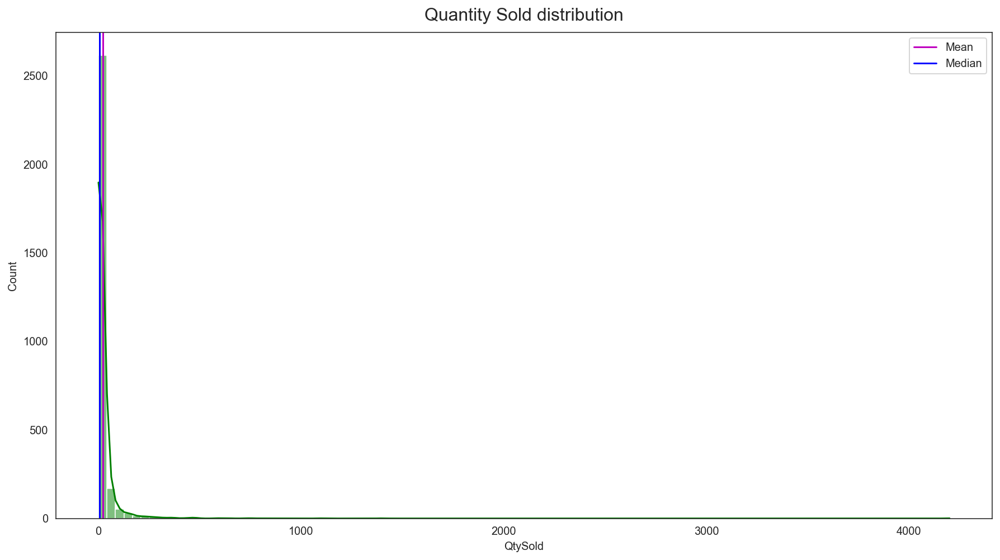

In [114]:
# Plot histogram and distribution curve for Qty Sold

plt.figure(figsize=(15, 8))
g = sns.histplot(df['QtySold'], color='g', bins=100, kde=True);
g.set_title('Quantity Sold distribution', y=1.01, fontsize=16);
plt.axvline(x=df["QtySold"].mean(),color="m",label="Mean")
plt.axvline(x=df["QtySold"].median(),color="b",label="Median")
plt.legend(loc='upper right');

After removing the extremely skewed product, we can still see that the distribution curve is extremely skewed to the right. Hence we will have to remove them in order to get a more accurate prediction in later stages.

In [115]:
# Find upper limit with 3x standard deviation/ z score of more than 3 for sales price
upper_limit = df.QtySold.mean() + 3*df.QtySold.std()

# Find upper limit with 3x standard deviation/ z score of less than -3 for sales price
lower_limit = df.QtySold.mean() - 3*df.QtySold.std()

# Check number of rows with saleprice outside of 3x standard deviation 
df[(df.QtySold > upper_limit) | (df.QtySold < lower_limit)].shape

(22, 18)

In [116]:
# Remove listings that are outisde of 3x standard deviation
df = df[(df.QtySold < upper_limit) & (df.QtySold > lower_limit)]
df.shape # Check if 4 rows are removed. 

(2902, 18)

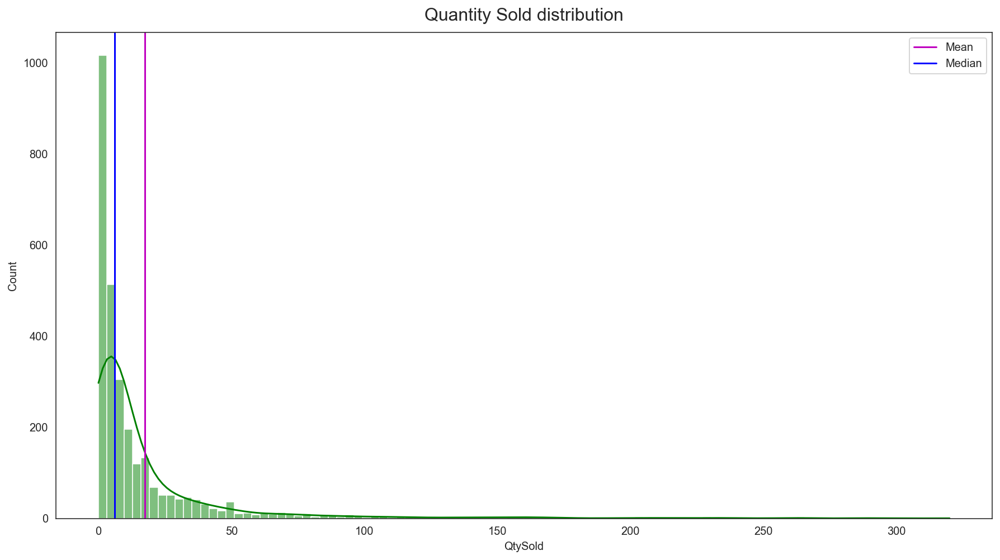

In [117]:
# Plot histogram and distribution curve for Qty Sold Again

plt.figure(figsize=(15, 8))
g = sns.histplot(df['QtySold'], color='g', bins=100, kde=True);
g.set_title('Quantity Sold distribution', y=1.01, fontsize=16);
plt.axvline(x=df["QtySold"].mean(),color="m",label="Mean")
plt.axvline(x=df["QtySold"].median(),color="b",label="Median")
plt.legend(loc='upper right');

After removing the tail ends of the dataset, we can still see that the distribution of the `QtySold` is not normal.

In [118]:
df.describe()

,OriginalPrice,SalePrice,Discount,Ratings,NoOfRatings,Comments,Media,QtySold,Favourites,Content
count,2902.000000,2902.000000,2902.000000,2445.000000,2902.000000,2902.000000,2902.000000,2902.000000,2902.000000,2902.000000
mean,24.531151,22.412216,7.022398,4.938364,4.616816,2.021020,1.635424,17.416954,5.445899,824.483115
std,24.985684,22.385560,8.769356,0.265503,8.647844,4.588616,3.795000,34.102445,10.325836,541.220056
min,1.150000,1.150000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,87.000000
25%,8.900000,8.400000,0.000000,5.000000,1.000000,0.000000,0.000000,3.000000,1.000000,384.000000
50%,16.900000,15.900000,3.000000,5.000000,2.000000,1.000000,1.000000,6.000000,2.000000,698.500000
75%,30.000000,28.500000,14.000000,5.000000,5.000000,2.000000,2.000000,16.000000,6.000000,1121.750000
max,299.000000,299.000000,69.000000,5.000000,105.000000,70.000000,59.000000,320.000000,184.000000,4121.000000


In [119]:
df.loc[df['SalePrice']>200]

,ProductName,OriginalPrice,SalePrice,Discount,Vouchers,Ratings,NoOfRatings,Comments,Media,Brand,QtySold,Favourites,ProductDescription,link,SubCat1,SubCat2,SubCat3,Content
434,SK II Men Facial Treatment Essence 230ml,289.0,260.1,10,None,5.0,7,5,3,SK-II,28,6,A specially formulated essence for men to refr...,https://shopee.sg/SK-II-Men-Facial-Treatment-E...,Beauty & Personal Care,Skincare,Serum & Treatment,392.0
925,SK-II R.N.A.POWER Radical New Age Moisturising...,228.0,205.2,10,None,4.3,4,3,1,SK-II,11,0,Benefits of Use:\nSuppler Skin: Improves firmn...,https://shopee.sg/SK-II-R.N.A.POWER-Radical-Ne...,Beauty & Personal Care,Skincare,Moisturizer,673.0
1571,TRU NIAGEN Healthy Aging NAD+ Booster Packset ...,209.7,209.7,0,None,5.0,2,2,2,Tru Niagen,19,8,"Rejuvenate your health, start from within\n\nC...",https://shopee.sg/TRU-NIAGEN-Healthy-Aging-NAD...,Health & Wellness,Food Nutrition,Others,1051.0
2012,GILLETTE Labs Waterproof Heated Razor Set cons...,299.0,299.0,0,"$6 OFF, $12 OFF, $25 OFF",5.0,1,0,0,Gillette,4,6,GILLTETTE Labs Waterproof Heated Razor Set con...,https://shopee.sg/GILLETTE-Labs-Waterproof-Hea...,Beauty & Personal Care,Men's Grooming,Shave,853.0


In [120]:
# Saving dtypes to variable as dataframe
df_types = df.dtypes.to_frame()

# Transform dataframe to display first three rows of all categorical features
df[df_types[df_types[0] == 'object'].index].head(5).T

,4,7,9,10,12
ProductName,ORITA Dehumidifier Charcoal 650ml x 48s (Per C...,Rohto Cool Eye Drops 13Ml,Watsons Peach Shower Gel 1L,Kinohimotsu Stemcell Drink 50ml x 16s + 6s,Zyrtec-R 2X10S
Vouchers,None,"$6 OFF, $12 OFF, $25 OFF","$6 OFF, $12 OFF, $25 OFF",None,None
Brand,ORITA,ROHTO,Watsons,KINOHIMITSU,Vapex
ProductDescription,ORITA Dehumidifier Charcoal 650ml x 48s (Per C...,Watsons is Singapore's leading beauty and heal...,Watsons is Singapore's leading beauty and heal...,"""Look younger and feel fantastic all at the sa...",Zyrtec R Twin Pack\n\nWatsons is Singapore's l...
link,https://shopee.sg/ORITA-Dehumidifier-Charcoal-...,https://shopee.sg/Rohto-Cool-Eye-Drops-13Ml-i....,https://shopee.sg/Watsons-Peach-Shower-Gel-1L-...,https://shopee.sg/Kinohimotsu-Stemcell-Drink-5...,https://shopee.sg/Zyrtec-R-2X10S-i.195238920.4...
SubCat1,Home Appliances,Health & Wellness,Beauty & Personal Care,Health & Wellness,Health & Wellness
SubCat2,Cooling & Heating,OTC Medications,Men's Grooming,Beauty Supplements,OTC Medications
SubCat3,Air Humidifier,"Eye, Nose, Throat Care",Bath & Body Care,Collagen,Others


In [ ]:
# Plotting total_area vs sale_price

plt.figure(figsize=(15, 8))
g = sns.regplot(data = train , x='NoOfRatings', y='QtySold', fit_reg=False, color='cornflowerblue');
g.set_title('Total Area vs. SalePrice', fontsize=16, y=1.01);